In [0]:
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import nltk
import string
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer
from sklearn.decomposition import TruncatedSVD

import re
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from pandas_ml import ConfusionMatrix

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_score, recall_score, make_scorer,f1_score

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score,precision_score,recall_score
from sklearn.cross_validation import cross_val_score
from collections import Counter
from sklearn import cross_validation
from prettytable import PrettyTable
from sklearn.model_selection import GridSearchCV,TimeSeriesSplit
from sklearn.model_selection import RandomizedSearchCV
from sklearn.utils import resample
from sklearn.datasets import *
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from wordcloud import WordCloud
from sklearn.neighbors import NearestNeighbors
import operator
from sklearn.metrics.pairwise import pairwise_distances

#We import a few useful libraries

# Utility Functions

In [0]:
#We create a few utility functions whose use is described below


def input_k(): #This function is used to obtain K value from the user
    k = int(input("Enter the value of K observed in the above plot: "))
    return k

def plot_df_wordcloud(data,labels_list,lst):
    #This function plots the wordcloud for Kmeans and Kmedoids. These will be called in the following functions.
    print('\n')
    print("Creating a dataframe with Reviews, Cleaned text and Clusters...")
    lst_reviews = list(data['Text'].values) #Saving all reviews into a list
    lst_cleanedtext = list(data['CleanedText'].values) #Saving all Cleaned text into a list
    amz = {'Reviews': lst_reviews,'CleanedText':lst_cleanedtext ,'Clusters': labels_list} #Creating a dictionary with Reviews, Cleaned text and clusters
    df = pd.DataFrame(amz, columns=['Reviews','CleanedText', 'Clusters']) #Creating a dataframe of the above dictionary
    print("Dataframe is created!")
    print('\n')
    
    print("The number of reviews in each cluster is:")
    print(df['Clusters'].value_counts()) #Outputs the number of reviews in each cluster
    print('\n')
    print('*'*70)
    
    if lst!=None: #Only used in case of K Medoids. Prints each medoid review
        print('\n')
        print('The number of Medoids formed are',len(lst))
        print('\n')
        print('Printing Medoid reviews')
        for a in lst:
            print('\n')
            pd.set_option('display.max_colwidth', -1) #Displays full reviews
            print(df['Reviews'][a])
            print('\n')
    
    for i in range(min(labels_list),max(labels_list)+1): #Iterates through K and prints wordcloud and reviews for all the clusters
        print('\n')
        print('\n')
        print("*"*40,'Cluster ',i,"*"*40)
        words=[] #Create an empty list to store words
        for sent in df['CleanedText'][df['Clusters']==i].values: #Splits sentences into words and stores it in a list
            words.append([a for a in sent.split()]) #Appends the split words to above created list
        
        word_list = [item for sublist in words for item in sublist] #Creates a new list of words by flattening the above list since it is a nested list
        print('\n')
        print('Plot of Word Cloud')
        wordcloud1 = WordCloud().generate(" ".join(word_list)) #Initiate wordcloud for the list of words
        plt.figure() #Plots the wordcloud
        plt.imshow(wordcloud1)
        plt.axis("off")
        plt.show()
    
        count = df['Reviews'][df['Clusters']==i].count()    
        if count//2>=9:#Prints random 5 reviews if the number of reviwes in that cluster is more than 100
            print('\n')
            print('\n')
            print('Printing 4 random reviews from cluster',i)
            pd.set_option('display.max_colwidth', -1) #Displays full reviews
            print(df['Reviews'][df['Clusters']==i][count//2:count//2+5])
            print('\n')
            print('\n')
        else: #Prints random reviews if the number of reviwes in that cluster is between 10 and 100
            print('\n')
            print('\n')
            print('Printing random reviews from cluster',i)
            pd.set_option('display.max_colwidth', -1) #Displays reviews in full length
            print(df['Reviews'][df['Clusters']==i][count//2:])
            print('\n')
            print('\n')

def k_means(data,std_data): #This function perform K means. The data frame and standardized vector forms of the reviews are given as input
    k=list(range(1,11)) #Considers K value between 1 and 10 (inclusive)
    inertia_list=[] #Gets the list of inertias for plotting the elbow curve
    for i in k: #Iterates through the K values and gets a list of inertia values for plotting later
        clf = KMeans(n_clusters=i,n_init=60)
        clf.fit(std_data)
        inertia_list.append(clf.inertia_)
    
    plt.figure(1) #Plots the elbow curve
    plt.plot(k,inertia_list)
    plt.title('K vs loss')
    plt.xlabel('K')
    plt.ylabel('loss')
    plt.grid()
    plt.show()
    
    k = input_k() #After looking at the elbow curve, the user inputs the optimal value of K
    
    print('\n')
    print("Performing K means on K=",k)
    clf = KMeans(n_clusters=k, n_init=60) #Perform K means on the optimal K value input earlier
    clf.fit(std_data)
    labels_list = clf.labels_.tolist() #Getting the labels list to identify clusters
    print("Done!")
    plot_df_wordcloud(data,labels_list,None)
    
def kMedoids(D, k, tmax=100): #This is the KMedoid implemetaion by https://github.com/letiantian/kmedoids
    
    # determine dimensions of distance matrix D
    m, n = D.shape

    if k > n:
        raise Exception('too many medoids')

    # find a set of valid initial cluster medoid indices since we
    # can't seed different clusters with two points at the same location
    valid_medoid_inds = set(range(n))
    invalid_medoid_inds = set([])
    rs,cs = np.where(D==0)
    # the rows, cols must be shuffled because we will keep the first duplicate below
    index_shuf = list(range(len(rs)))
    np.random.shuffle(index_shuf)
    rs = rs[index_shuf]
    cs = cs[index_shuf]
    for r,c in zip(rs,cs):
        # if there are two points with a distance of 0...
        # keep the first one for cluster init
        if r < c and r not in invalid_medoid_inds:
            invalid_medoid_inds.add(c)
    valid_medoid_inds = list(valid_medoid_inds - invalid_medoid_inds)

    if k > len(valid_medoid_inds):
        raise Exception('too many medoids (after removing {} duplicate points)'.format(
            len(invalid_medoid_inds)))

    # randomly initialize an array of k medoid indices
    M = np.array(valid_medoid_inds)
    np.random.shuffle(M)
    M = np.sort(M[:k])

    # create a copy of the array of medoid indices
    Mnew = np.copy(M)

    # initialize a dictionary to represent clusters
    C = {}
    for t in range(tmax):
        # determine clusters, i. e. arrays of data indices
        J = np.argmin(D[:,M], axis=1)
        for kappa in range(k):
            C[kappa] = np.where(J==kappa)[0]
        # update cluster medoids
        for kappa in range(k):
            J = np.mean(D[np.ix_(C[kappa],C[kappa])],axis=1)
            j = np.argmin(J)
            Mnew[kappa] = C[kappa][j]
        np.sort(Mnew)
        # check for convergence
        if np.array_equal(M, Mnew):
            break
        M = np.copy(Mnew)
    else:
        # final update of cluster memberships
        J = np.argmin(D[:,M], axis=1)
        for kappa in range(k):
            C[kappa] = np.where(J==kappa)[0]

    # return results
    return M, C #Here M is an ndarray with indicies of medoids formed and C is a dictionary with Cluster number as key and indicies as values.

def implement_kmedoids(data,std_data,D): #This function implements Kmedoids by taking dataframe and standardized data as input.
    k=list(range(2,11)) #Considers K value between 2 and 10 (inclusive)
    labels_list=[] #Gets the list of labels for each k and stores them into another list 
    silhou_list=[] #Gets the list of silhouette values for each k to plot a bar graph later
    M_list=[] #Gets the list of Medoid indices for each k and stores it in another list
    for i in k: #Iterates through the K values
        M, C = kMedoids(D,i) #Initiate K Medoids by inputing the distance matrix and value of K
        dict = {} #Creating a dictionary to sort through the values later
        labels_list_med = [] #Creates a list for appending label values into it later
        for label in C: #The dictionary C consists of number of keys equal to the number of labels with each label having an ndarray of indices as values.
            for point_idx in C[label]: #For an index in each label in the dictionary
                dict[point_idx] = label #Creating a new dictionary with indices as keys and labels as values
            
        sorted_dict = sorted(dict.items(), key=operator.itemgetter(0)) #This is sorted on the basis of keys(Indices) and returns a list of tuples
        for o in range(len(sorted_dict)): 
            labels_list_med.append(sorted_dict[o][1]) #Gets the list of label values only from the sorted tuples
    
        avg_silhou = silhouette_score(std_data,labels_list_med) #Initialize silhouette score
        silhou_list.append(avg_silhou) #Append all the silhoutte scores into the list created above to plot later
        labels_list.append(labels_list_med) #Append all the lists of labels for each K into another list for use later
        medoid_list = M.tolist() #Convert array of Medoid indices into list
        M_list.append(medoid_list) #Append this list of each Modoid indices for every K to another list for use later
        
        if i == 2 or i == 5 or i == 10: #To check what is happening to clusters at random values of K
            print('\n')
            print('\n')
            print('='*10,'When number of clusters is',i,'='*10)
            print('\n')
            plot_df_wordcloud_med(data,labels_list_med,medoid_list) #Creates a dataframe with Reviews, CLeanedText and Clusters and plots wordcloud and prints reviews
    
    plt.figure(1) 
    plt.bar(k,silhou_list) #Plots the bar graph
    plt.title('K vs Average Silhouette Score')
    plt.xlabel('K')
    plt.ylabel('Average Silhouette Score')
    plt.show()
    
    for i in range(2,11):
        print("The average Silhouette value of K = {} is {}".format(i,silhou_list[i-2]))
    
    print('\n')
    print('\n')
    max_silhou = max(silhou_list) #Maximum value of silhouette score among all Ks
    k = silhou_list.index(max_silhou)+2 #K value of the corresponding maximum silhouette score
    print('We can observe that K = {} has the highest average silhouette score of {}.'.format(k, max_silhou))
    print('\n')
    print('\n')
    
    if k==2 or k==5 or k==10: #Since these values of k are already plotted we don't plot them again
        print("The wordcloud and reviews for K = {} is already output above.".format(k))
    
    else: #Plot if not above
        print('\n')
        print("The wordcloud and reviews for optimal K = {} is plotted as follows.".format(k))
        print('\n')
        plot_df_wordcloud(data,labels_list[k-2],M_list[k-2]) #Since we already stored the list of labels and medoids

# Bag of Words using K Means

In [0]:
import pandas as pd
final = pd.read_csv("grouped_data_200.csv")
p = final.groupby('Score')
pos = p.get_group('Positive') #Gets the groups with Positive score
neg = p.get_group('Negative') #Gets the groups with Negative score
pos_2000 = pos.sample(10000) #Gets 10000 reviews of positive and 7000 negative scores
neg_2000 = neg.sample(7000)
grouped_data = pd.concat([pos_2000, neg_2000], ignore_index = True) #This data now contains positive and negative data in order.
grouped_data.dropna(inplace = True) #Drops rows with Nan
grouped_data.reset_index(inplace=True) #Replaces missing indexes
grouped_data.drop(['Unnamed: 0', 'Unnamed: 0.1', 'Score'], axis=1, inplace=True)
grouped_data = grouped_data.sort_values('Time', axis=0, ascending=True, kind='quicksort')
print("The shape of grouped data is {}".format(grouped_data.shape))

The shape of grouped data is (17000, 11)


Observations:
A csv file is imported which consists of 200000 data points. These data points are already sorted on the basis of time. We create a new dataframe with over 17000 data points.

In [0]:
from sklearn.preprocessing import StandardScaler
count_vect = CountVectorizer()
vocab = count_vect.fit_transform(grouped_data['CleanedText'].values.astype('U'))
data = StandardScaler(with_mean=False).fit_transform(vocab)

Observations: Data is vectorized and standardized.

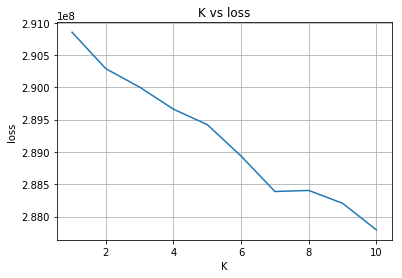

Enter the value of K observed in the above plot: 7


Performing K means on K= 7
Done!


Creating a dataframe with Reviews, Cleaned text and Clusters...
Dataframe is created!


The number of reviews in each cluster is:
4    16504
0    491  
6    1    
5    1    
3    1    
2    1    
1    1    
Name: Clusters, dtype: int64


**********************************************************************




**************************************** Cluster  0 ****************************************


Plot of Word Cloud


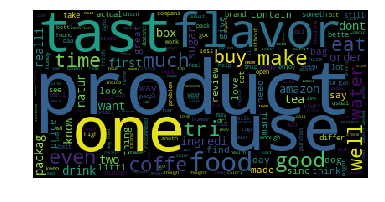





Printing 7 random reviews from cluster 0
0    Friends, I love good food. This Chili Kit by Carroll Shelby is excellent. It creates an extremely savory basic chili that is easy to adjust to your particular taste in the areas of: spicy/hot, salt, or thickness.<br /><br />The flavor created by the spices in the main packet is the best attribute. Lots of deep, low, earthy tones that have excellent complexity and subtlety.<br /><br />Another great feature is the brilliant strategy of putting the cayenne pepper in a separate pouch. I only put in a little. My wife likes her chili slightly warm: warm enough to be interesting. So, I put about 1/8th of the cayenne pouch when I cook the chili, then I sprinkle extra on only my serving when I eat my bowl-full. I like a little more warmth to add to the complex flavors without so much heat that I begin to loose the ability to taste all those wonderful layers of tastes.<br /><br />It is another exceptionally brilliant idea to put the salt in yet a

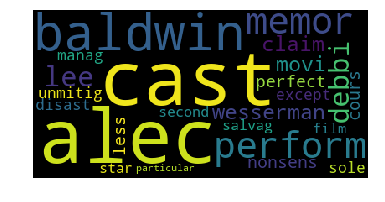





Printing all reviews from cluster 1
1    Debbie Lee Wesserman claims that "the casting for this movie is perfect, with only Alec Baldwin's performance less than memorable". This is of course nonsense - the casting was an unmitigated disaster with the sole exception of Alec Baldwin who manages to salvage a second star for the film with a particularly memorable performance.
Name: Reviews, dtype: object








**************************************** Cluster  2 ****************************************


Plot of Word Cloud


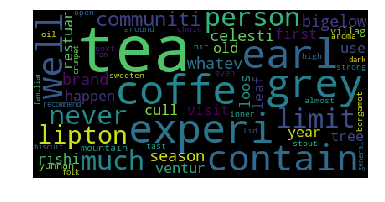





Printing all reviews from cluster 2
2    I was never much of a tea person.  My experiences with tea have been limited to Lipton, Community, some Bigelow, Celestial Seasonings and whatever brand that happens to be in use at the restuarants I visit.  With Rishi's Earl Grey, I ventured into my first loose leaf tea experience.<br /><br />Culled from 1300 year old trees of the Yunnan mountain villages, this Earl Grey is strong, almost sweetened coffee-like in taste.  If there's no coffee around, this tea would be my next choice.  It contains bergamot oil as well.  It has a stout aroma that hits you before you even open the inner lid of the container.<br /><br />I highly recommend this tea to fans of dark teas in general, as well as folks like myself who are more familiar with coffee and biscuits than tea and crumpets.
Name: Reviews, dtype: object








**************************************** Cluster  3 ****************************************


Plot of Word Cloud


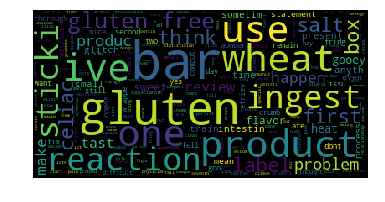





Printing all reviews from cluster 3
3    Chomped one down as soon as the pack arrived. First impressions: 'Way gooey but probably had been subjected to excess heat in PO truck. Salt dominates compared to other bars I've had that call themselves sweet and salty, which flavor combo I have liked very much but is not present in this bar. Dense and filling - satisfying - for its size.<br /><br />Above all, anything that takes the time and effort to be and label itself Gluten Free gets a huge thumbs-up from me. Statisticians used to think about 1 in 250 in the US could not tolerate wheat or gluten; today's estimate is more like 1 in 100 as physicians are starting to think outside the boxes into which they were trained, and are recognizing celiac disease and/or wheat allergy as the causes of persistent, hard-to-diagnose intestinal problems sometimes presenting as late as the sixth or seventh decade of life.<br /><br />There is one small glitch here, not sure how small a glitch. These bars

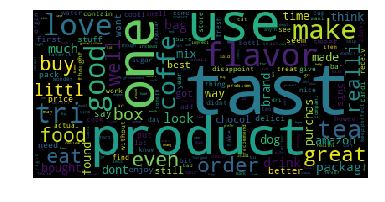





Printing 7 random reviews from cluster 4
4    Has an oily film on it. Good flavor. Somewhat thick consistency. Made me question whether it was really raw. It seemed more manufactured or processed than other raw foods I've had.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        
4    Bob's Red Mill Roasted Oregon Hazelnuts tasted stale and over cooked.  This is not a quality product and not good value for the money.  Don't waste your money on this item.                                                                        

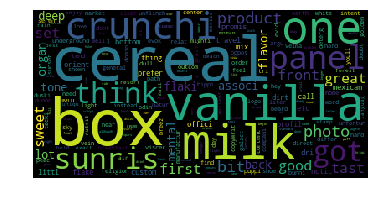





Printing all reviews from cluster 5
5    The name: "Crunchy Vanilla Sunrise" evokes a lot.  The first word sets the tone, and unfortunately I tend to relate "crunchy" first with hippies, Earth shoes, organic detergent, underground homes, crystal-based religions, and a general flakiness.  Now one could argue that "flaky" and "cereal" is a good mental association, but I doubt the copywriters and marketers were thinking in this vein.  I think they were after the more visceral, literal, "Hey, Velma, by the great white beard of Odin, this here cereal is mighty crunchy!  I can hardly hear myself think!" outcome.  "Vanilla," on the other hand, is what got me to order this product.  I love vanilla, and had to try this out.  "Vanilla" had me thinking "deep, dusky flavor," as opposed to "dull," which the box's back panel tackles unflinchingly.  And then you get "sunrise."  Well, the mental association intent is evident here; it's all about setting a deep and contented feeling centered direct

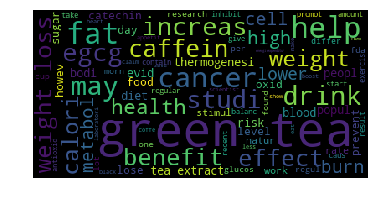





Printing all reviews from cluster 6
6    Weight Loss Benefits of Green Tea<br />=================================<br /><br />If you drink green tea you can-<br />* Lower Cholesterol<br />* Increase Thermogenesis (the body's rate of burning calories)<br />* Enhance fat oxidation<br /><br />Burns Fat Naturally<br />Green tea contains high concentrations of catechin polyphenols. These compounds work with other chemicals to intensify levels of fat oxidation and thermogenesis, where heat is created in the body by burning fuels such as fat. Drinking Japanese green tea regularly will increase your metabolism and help burn fat safely and naturally.<br /><br />Lowers cholesterol and increases energy expenditure<br />Green tea also causes carbohydrates to be released slowly, preventing sharp increases in blood-insulin levels. This promotes the burning of fat.<br />The thermogenic effect was originally attributed to its caffeine content. However, green tea stimulates brown fat thermogenesis f

In [0]:
k_means(grouped_data,data)

## Observations:

**1.** Through the elbow plot it can be observed that k = 7 can be considered as an optimal K value.

**2.** Cluster 4 has 16504 and cluster 0 has 491 data points. Rest all clusters have one data point each.

**3.** Cluster 0 consists of frequently occuring words like 'product', 'one', 'tast', 'use'. It can be inferred that the product used tastes good and its flavour is liked by most customers.

**4** Cluster 1 looks like a completely different product compared to rest all as it is about a movie starring Alec Baldwin.

**5.** Cluster 2 talks about beverages like tea and coffee.

**6.** Cluster 3 is about a product about gluten free bar containing wheat which the customer could injest well.

**7.** Cluster 4 consists of words like 'tast', 'product', 'one', 'use'. Most of the customers liked them.

**8.** Cluster 5 is about a vanilla flavoured cereal.

**9.** Cluster 6 is about green tea. The customer talks about its benefits while describing various studies.

# Bag of words using K Medoids

In [0]:
import pandas as pd
final = pd.read_csv("drive/grouped_data_200.csv")
p = final.groupby('Score')
pos = p.get_group('Positive') #Gets the groups with Positive score
neg = p.get_group('Negative') #Gets the groups with Negative score
pos_2000 = pos.sample(10000) #Gets 12000 reviews of positive and 7000 negative scores
neg_2000 = neg.sample(7000)
grouped_data = pd.concat([pos_2000, neg_2000], ignore_index = True) #This data now contains positive and negative data in order.
grouped_data.dropna(inplace = True) #Drops rows with Nan
grouped_data.reset_index(inplace=True) #Replaces missing indexes
grouped_data.drop(['Unnamed: 0', 'Unnamed: 0.1'], axis=1, inplace=True)
grouped_data = grouped_data.sort_values('Time', axis=0, ascending=True, kind='quicksort')
scores=grouped_data['Score']
print("The shape of grouped data is {}".format(grouped_data.shape))

The shape of grouped data is (17000, 12)


Observations:
A csv file is imported which consists of 200000 data points. These data points are already sorted on the basis of time. We create a new dataframe with over 17000 data points.

In [0]:
from sklearn.preprocessing import StandardScaler
count_vect = CountVectorizer()
vocab = count_vect.fit_transform(grouped_data['CleanedText'].values.astype('U'))
data = StandardScaler(with_mean=False).fit_transform(vocab)

Observations: Data is vectorized and standardized.

Lets perform dimensionality reduction techniques like TruncatedSVD and select the number of components with good explained variance

In [0]:
svd = TruncatedSVD(n_components = 2000)
data = svd.fit_transform(data)
print("Percentage of variance retained is {}%".format(svd.explained_variance_ratio_.sum()*100))

Percentage of variance retained is 56.10360178967093%


Observations: Dimensionality reduction is performed and percentage of variance retained is shown.

In [0]:
D = pairwise_distances(data)

Observations: Pairwise euclidean distances are calculated from each point.





========== When number of clusters is 2 ==========




Creating a dataframe with Reviews, Cleaned text and Clusters...
Dataframe is created!


The number of reviews in each cluster is:
1    16893
0      107
Name: Clusters, dtype: int64


**********************************************************************


The number of Medoids formed are 2


Printing Medoid reviews


I eat these with my cereal every morning and love them. I order them by the case because sometimes it is hard to find the slivered ones at my local store.




Tastes great and the price was good.






**************************************** Cluster  0 ****************************************


Plot of Word Cloud


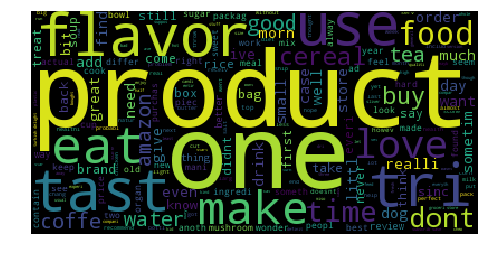





Printing 4 random reviews from cluster 0
8490    Seriously WTF was Kikkoman thinking releasing this product. Makes me wonder if they even did any product testing, because anyone in their right mind would know this stuff is foul tasting. The lemongrass is way overpowering, there is barely any curry taste, it is sour mostly. Avoid at all costs. Major letdown                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

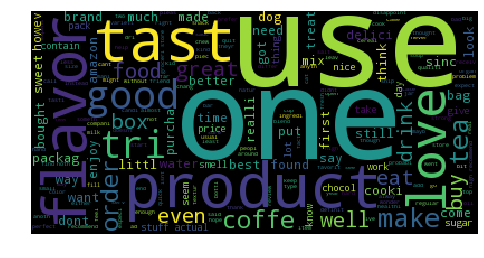





Printing 4 random reviews from cluster 1
8500    These where just plain awful.  White-ish color and crusty.  They had a very bland taste and what taste they had was bad, not sweet or sour just awful.  I gave 1 star only because you can't give ZERO stars.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

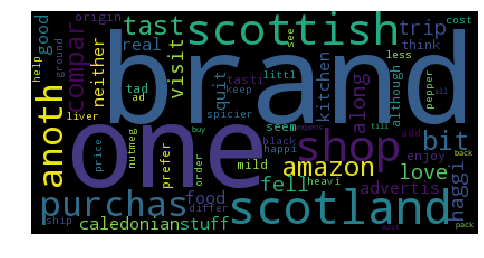





Printing random reviews from cluster 0
2805    I fell in love with haggis on my trips Scotland.  When visiting a Scottish shop in NC I purchased this brand along with another brand advertised here on Amazon (Caledonian Kitchen), just to compare.  Neither one are quite like the real stuff, but what canned food is as good as the original?  Both are tasty although both are a bit mild compared to what I enjoyed in Scotland.  I think I prefer the taste of this one. This brand seems to be a tad spicier than the CK and not so heavy on the liver.  I add a bit of ground black pepper and nutmeg which helps.  I was happy to see it on Amazon, but the price added with shipping costs keeps me from purchasing it.  For the little difference in taste, I ordered the less expensive CK in the 3 pack.  I'll wait till I go back to NC or another Scottish shop to buy this one.
Name: Reviews, dtype: object








**************************************** Cluster  1 ****************************************


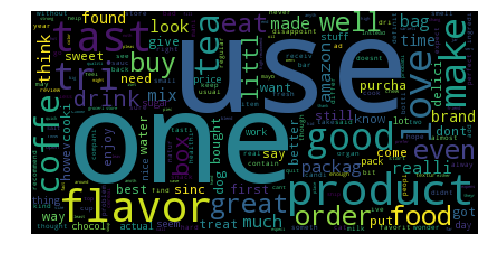





Printing 4 random reviews from cluster 1
8499    If you are a fan of Larabars like I am stick with the fruit bars. They are delicious. I ordered these without trying them and was very disappointed. They are dry and not the least bit sweet.  You do have to realize that you are not eating a candy bar, and that there is only 3-4 ingredients in most Larabars.  This works for the fruit flavors but not for this particular Larabar. I would not order them again.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

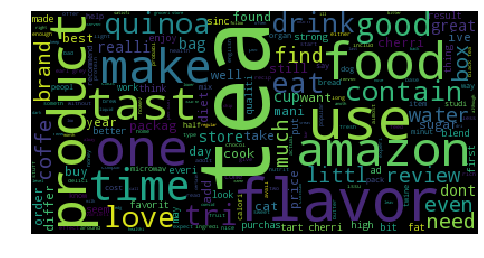





Printing 4 random reviews from cluster 2
8035    My wife and I, at least, are agreed that these chips are pretty much indistinguishable from the normal potato chips we've always been used to. They are flavorful and crispy. That's what you are looking for in a potato chip. The price is pretty much the same as regular potato chips too. At our local grocery, they were about $4 a bag. These are one of the few food items that appear to cost much MORE on Amazon (because it is an Amazon seller and not Amazon itself selling them).<br /><br />They do use Olestra as a fat substitute. Olestra is a no-calorie fat substitute discovered by Proctor and Gamble back in the late 60s. It was finally approved as a food additive almost 30 years later. It has the warning of side effects of stomach cramps and diarrhea. However, these side effects are not supposed to occur unless you consume a large amount of it in a short space of time. I have not been eating these for long, but I have not experienced th

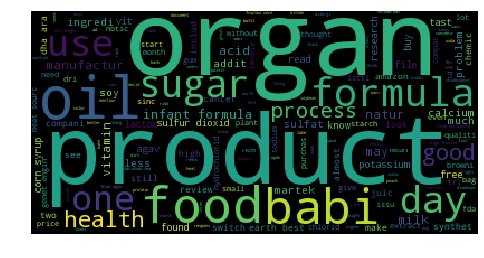





Printing random reviews from cluster 3
14173    I have been buying dried peaches all the time through Sahara. My local store has increased the price this year and I started looking on Amazon. Found this one and ordered. It took almost a month to arrive and smells terrible. I am pretty sure that the manufacturer used Sulfur dioxide to process the peaches and left this stinky smell. I was in a hurry to travel to EU for a month right after I received the peaches and was not able to file a return. Do not buy if you care about your health. The product description does not include using this chemical for processing. I gave one start because I could not give lower.                                                                                                                                                                                                                                                                                                                                          

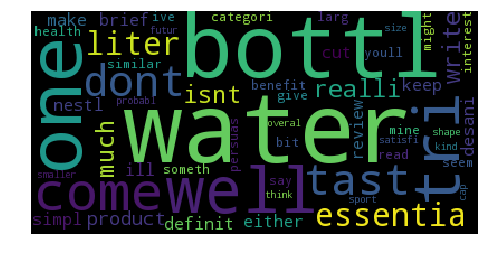





Printing random reviews from cluster 4
15546    Well, there really isn't much that you can write about a product that is as simple as water, so I'll try to keep this review brief. When it comes to bottled water, I either like their taste or I don't. The ones that I like are Desani and Nestle waters, with most of the other ones not making the cut. Essentia is definitely in the "like" category, so if you have a similar taste to mine you'll like this one as well. I've been reading about the benefits of 9.5 pH for your health, and they seem persuasive so if this is something that you might be interested in then I'd say to give this water a try. The 1.5 liter bottle is a bit too large for me, so I'd probably go for a smaller size (0.5 liter or so) in the future. I also like the sports bottle shape of the cap more, but I don't think that Essentia comes with those kinds of bottles. Overall, very satisfied.
Name: Reviews, dtype: object








========== When number of clusters is 10 =====

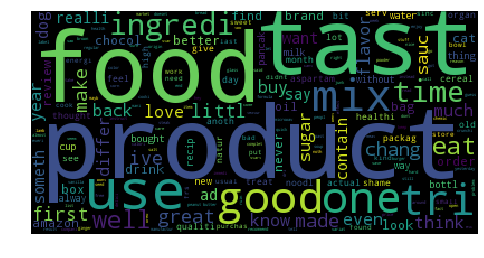





Printing 4 random reviews from cluster 0
9765     my coworker bragged this soup up...she brought in the tomato bisque...first of all, she made it in the container...it specifically says to heat on the stove or microwave in a seperate container...oh well, I decide to try anyway since she wanted to share w/ me...flavor is well....salty first, a little heat, VERY creamy...some oily seperation around the edges and it stained my lips, tongue and inside of my mouth...it just doesn't 'feel' like your eating healthy...blehhhh....not too mention the last ingredient is autolyzed yeast extract...hidden MSG!!! shame shame Campbells!!! I will never try this again...yuck...I have always preferred my healthy and very flavorful homemade soups!!!                                                                                                                                                                                                                                                                 

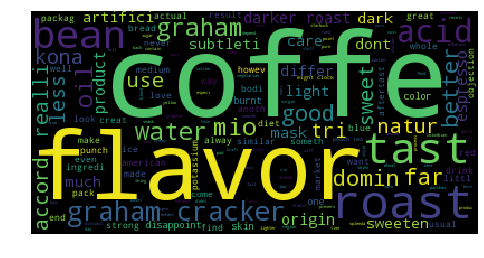





Printing random reviews from cluster 1
6727     I agree 100% with "nuttinbutdtruth"--this coffee is great and, thankfully, does not have the Starbucks "burnt" flavor which comes from roasting the beans to a higher internal bean temperature (i.e., burning them).  The Eight O' Clock 100% Colombian coffee is smooth with a real coffee flavor.  I have also bought Eight O' Clock Original coffee, and it tastes similar to the Colombian--both are great tasting and apparently are American Roast ("American Roast is a light to medium roast...This roast results in a full bodied, acidic cup of coffee.").<br /><br />Starbucks coffee, on the other hand, tastes to me like French Roast ("French roast is similar to Espresso roast only a little bit darker. This roasting style produces a full bodied coffee that has low acidity and a dominating bittersweet flavor.") or maybe Italian Roast ("Italian roasted coffee beans are nearly completely black in color. This roasting style produces a coffee that is v

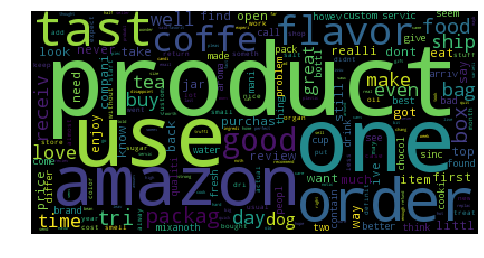





Printing 4 random reviews from cluster 2
8365    Royal Oak is the very best at this moment.  There are a dozen other brands that I have tried and, speaking as a former Virginian, this one is at the summit.  They are so large, so crunchy, and so tasty that you will insist on EATING THEM ONE AT A TIME.  The Royal Oak container is still a 40-ounce can, which was once the industry standard.  Many competitors have slipped to 36 ounces or even 32.  Be careful when you select others.  You may not be buying the number of peanuts you expected.  Don't accept any peanuts that were canned over six months ago, as they could be stale.  I am not connected with this company in any way, other than as a customer.                                                                                                                                                                                                                                                                                             
8395  

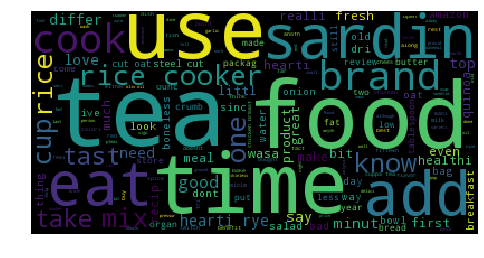





Printing 4 random reviews from cluster 3
7795     I've been eating Wasa Hearty Rye since I first found it in Europe 20 years ago as a teen ("ooh, what's that, it looks yummy") and when I returned to the US in my early 20s I kept buying it.<br /><br />Lately in my area of WA state, the "Hearty Rye" is no longer available, and nor is the "Hearty" crispbread.<br /><br />I found the Hearty Rye here on Amazon with a "Hurry only three boxes left" - I bought two of them, then noticed that everyone was rating THIS Wasa 5 stars and talking about it being Rye.  I've had this kind before and wondered because it tasted like "Hearty Rye" but it only says "Hearty" on it.<br /><br />Now this kind isn't available in this area anymore either :(<br /><br />I love Ak-Mak Sesame Crackers and have been eating those, but now that I can get "Hearty" here on Amazon... and know that it is the old "Hearty Rye" I can have what I've loved for so many years, low carb, high fiber, and if this is indeed the equi

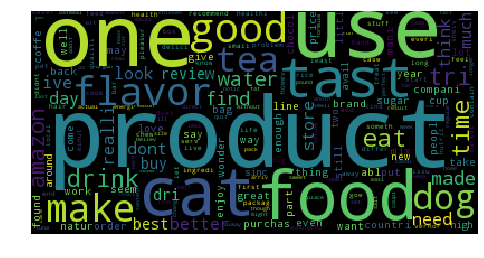





Printing 4 random reviews from cluster 4
8453    I bought both the CET HEXtra premium oral hygiene chews and CET Enzymatic Oral Hygiene Chews to switch off so my dog doesnt get tired of chewing the same thing over and over. I have a 13 pound Chug (pug chihuahua mix) and I buy the large then cut them into 2 or 3 long pieces. At first I gave her the Enzymatic chew which lasted her a whole day or even two which is good because she usually goes threw chew treats within an hour. Then I gave her the HEXtra chew to try and she loves this one. Most of the pieces are thinner but still last a good day of chewing. I cant even get within 2 feet of her before she starts growling then she just runs away with it lol. I find that most of the chews for the HEXtra are much thinner and easier to cut with basic scissors. For the Enzymatic half the time I have to use a knife to cut it. After she had a taste of the HEXtra she slowly steers away from the Enzymatic each time we give her one. After 2 weeks

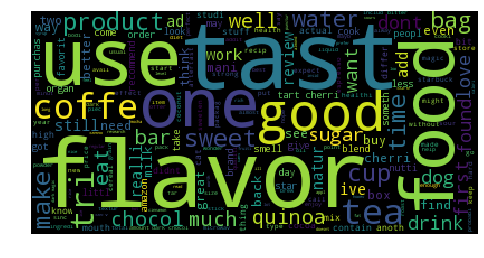





Printing 4 random reviews from cluster 5
10655    Our two orange males are approximately 10 and 11 years old. They both experienced health problems this summer with cystitis plus anal gland infections in our "double wide" Tigger. We started out with Merrick with grain and have transitioned them without issue to the before grain.<br />Tigger was 24.5lbs and is now below 19lbs. Gracie had a slight weight problem and now is at a steady weight. They both love the food, thankfully.  They lived on dry food until this summer when they became so ill. We were told to use Hills prescription, but it was so hard to get it from the vet, I decided to do some reading to find a good food I could buy easily.<br />This food is expensive;however, vet bills are much worse.  Both cats have beautiful coats now. They play, run around as if they are much younger and have not been ill since being on this diet.                                                                                                  

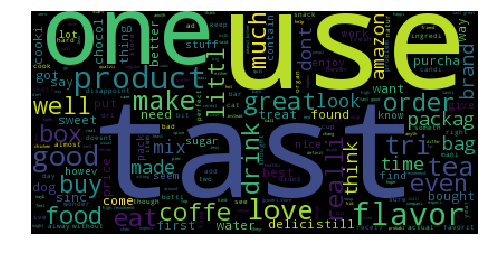





Printing 4 random reviews from cluster 6
8495    This is the BEST Green Tea I have ever had.  It has a lite fruity flavor & there's no green tea  after taste-  definitely my new FAV!!!!                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
8496    This stuff is great for frying foods. It can stand high temps and has no coconut smell so you don't have to worry about your food tasting sweet or coconutty.<br /><br />I ordered 4 but only received 3 and one leaked through the box but I let the seller know and they immediately replaced the damaged jar and the missing jar. Thanks Vi

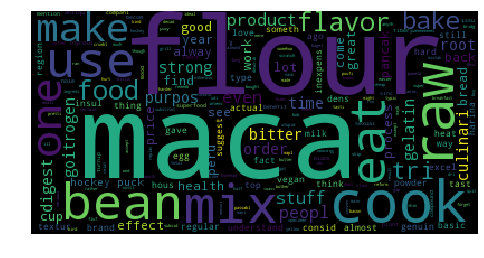





Printing random reviews from cluster 7
11414    Maca powder = maca flour. I have cooked with maca flour ten years, as a baking and cooking ingredient/flavoring. In Peru, maca flour, or "harina de maca" is a relatively cheap regional culinary flour. Raw Reform is a great specimen of this culinary flour; ideal for cooking, an excellent nutty flavor, it's bitterness subsiding with heat. A decade ago I could buy 'harina de maca' for $8/kg (and in Peru, it's a mere $2-4/kg) - now I see this same inexpensive Peruvian cooking flour sold as a "raw superfood" at an inflated price. It's very odd to have witnessed this metamorphosis.<br /><br />The reason I gave this ONE star is simple - this company (among several others) suggests that you to eat this flour raw. Like other cruciferous roots, maca can be particularly difficult to digest when raw. Not only is it fiber-dense, it contains lots of goitrogenic compounds (a term which means 'thyroid-interfering,' not "goiter causing") - that's why 

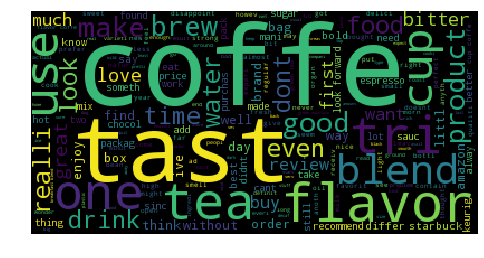





Printing 4 random reviews from cluster 8
8695    I am a lover of pork rinds so i was really looking forward to eating fresh ones, neathers to say they dident cook in 5 mins like it says it would and if you put it in that long most would burn to a crisp by that time, another thing that really dident appel to me is that the taste is like they poured tones of salt on them before they packaged them.... i wanted to eat pork rinds NOT salt, if i wanted to salt i would just get it from the salt in my seasons cabnet...very disappointed...                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

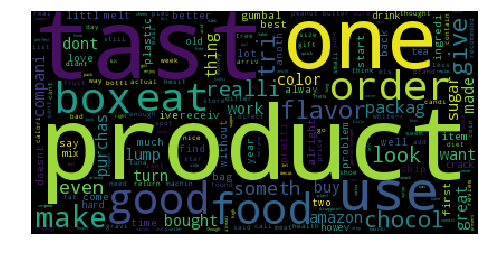





Printing 4 random reviews from cluster 9
7247    I just bought my second box of Jack's Links because I'm sold on these!  I purchased a box of small Slim Jim's for my son's lunch box and for throwing snacks in my bag for the long afternoons of driving kids around to activiities and someone ALWAYS asking if I have something to eat!!  The Slim Jims were just ok, but after time got really hard, even in their individually packaged cases.  So I bought the Jack Link's X Stick and immediately my 10 year old son said they were WAY better than Slim Jims.  The 0.5 oz size is a little bigger than the small Slim Jims, yet not too big so that I'm filling my kid with even more fat and junk.  This is just the right size for a "snack" and the price is great.  At Amazon today I bought a box of 50 on sale for $17, which is about .35 cents a stick.  Don't hesitate to buy these if you are like me and need a variety of on-the-go, non-refrigerated snacks or lunch box fillers!!  Great product!            

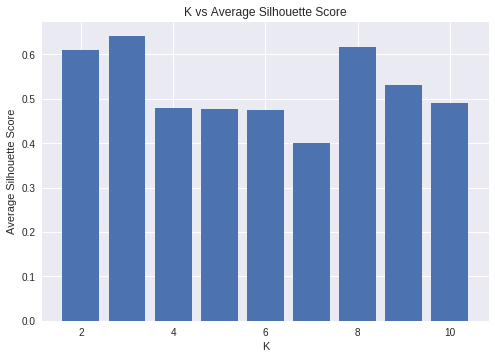

The average Silhouette value of K = 2 is 0.6106389540721466
The average Silhouette value of K = 3 is 0.6411517208514491
The average Silhouette value of K = 4 is 0.4794081312111225
The average Silhouette value of K = 5 is 0.4772435455629473
The average Silhouette value of K = 6 is 0.4739557028415693
The average Silhouette value of K = 7 is 0.39979199462970494
The average Silhouette value of K = 8 is 0.6166609203126013
The average Silhouette value of K = 9 is 0.5299579997306707
The average Silhouette value of K = 10 is 0.490452108525986




We can observe that K = 3 has the highest average silhouette score of 0.6411517208514491.






The wordcloud and reviews for optimal K = 3 is plotted as follows.




Creating a dataframe with Reviews, Cleaned text and Clusters...
Dataframe is created!


The number of reviews in each cluster is:
2    16972
1    27   
0    1    
Name: Clusters, dtype: int64


**********************************************************************


The number of Medoids

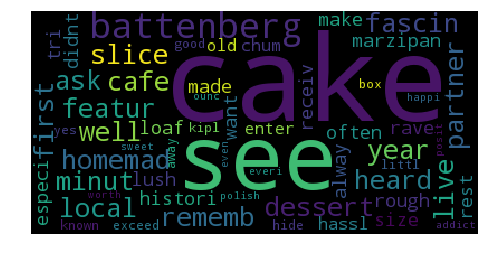





Printing random reviews from cluster 0
2564    I lived in the UK for 5 years and can remember first seeing Battenberg in a local cafe that featured homemade dessert cake slices. I was fascinated and asked my partner what it was. Well, the minute I heard marzipan, I HAD to try it and the rest is history.<br /><br />I often made my own which is roughly the size of a loaf cake and received raves for ''making an especially lush'' cake. BUT I didn't always want the hassle of doing my own. Enter my old chum Mr. Kipling and his exceedingly good cakes. Yes, they are and I was known to hide away with a box of 5 little Battenbergs, polishing them off in an evening. I am so happy to see them here. They are very sweet and worth every ounce!<br /><br />Positively addictive!
Name: Reviews, dtype: object








**************************************** Cluster  1 ****************************************


Plot of Word Cloud


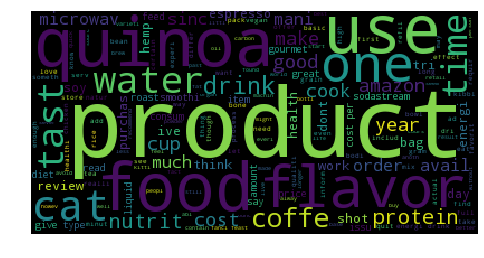





Printing 4 random reviews from cluster 1
8210     Let me start by saying I absolutely love Twizzlers.  These are definitely not Twizzlers!  I've never tasted anything Pomegranate before this.  They do have a nice, sweet flavor.  I like it!  I don't usually "do" organic, I couldn't care less, really, so that doesn't matter to me.  I just wanted to see how they tasted.<br /><br />The texture is a little harder (tougher?) than the aforementioned Twizzlers.  LOL!  This results in more pulling on dental work but they're not so hard that it did any damage to my dental work, and I have alot of that to worry about!  I would definitely buy these, just not on a regular basis.  Kind of a treat with a unique (yummy) flavor!                                                                                                                                                                                                                                                                                   

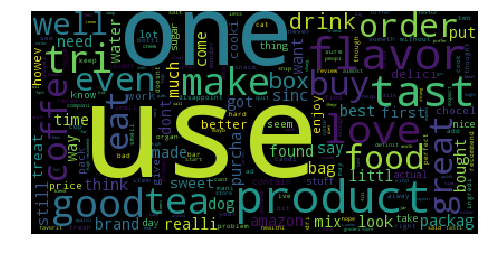





Printing 4 random reviews from cluster 2
8501    I love both Marmite and Vegemite, but have always preferred Marmite. I recently exhausted my last jar, so decided to order the 4 pack from Amazon since I live in the US and it is hard to come by. Now, my previous jars of Marmite were a thick, nearly black paste, resembling bearing grease, but this stuff is so thin I can almost pour it out.  It's also much, much lighter in color. I made a couple of slices of toast and spread one with my Vegemite, the other with my new Marmite. I was shocked at the lightness of the Marmite. More shocking was the flavor seemed to be less intense than the Vegemite, which was not the case before. I have since read that many long time Marmite fans have been complaining about a change in our beloved spread. Unilever denies any change in the recipe, but that is nonsense. It's still tasty, and the seller ships quickly, so I'm giving it 4 stars, but I'm beginning to prefer Vegemite over this "new" Marmite. The

In [0]:
implement_kmedoids(grouped_data,data,D)

Observations: 

**1.** Wordcloud and reviews are printed for k values of 2, 5, 10 to get a sense of what's going on  with the data.

**2.** Silhouette scores are plotted for each values of k ranging from 2 to 10. It is observed that k=3 has the highest average silhouette score, hence we declare that k=3 is the best suited number of clusters.

**3.** Since the average value of all the silhouette scores is around 0.51, k values of 2, 8, 9 can also perform reasonably well.

**4.** When k=3, cluster 0 has 1 elements compared to 27 in cluster 1 and 16972 in cluster 2.

**5.** Three medoids are formed and their reviews are printed above.

**6.** Cluster 0 talks about a customer reviewing a cake which he had at a place which he found fascinating.

**7.** Cluster 1 talks about food products especially liquids.

**8.** Cluster 2 reviews mostly revolve around the words 'one', 'use', 'product' and 'love' which gives us the sense that it is about products which the customers loved upon usage once.

# TFIDF using K Means

In [0]:
import pandas as pd
final = pd.read_csv("grouped_data_200.csv")
p = final.groupby('Score')
pos = p.get_group('Positive') #Gets the groups with Positive score
neg = p.get_group('Negative') #Gets the groups with Negative score
pos_2000 = pos.sample(10000) #Gets 30000 reviews of positive and 20000 negative scores
neg_2000 = neg.sample(7000)
grouped_data = pd.concat([pos_2000, neg_2000], ignore_index = True) #This data now contains positive and negative data in order.
grouped_data.dropna(inplace = True) #Drops rows with Nan
grouped_data.reset_index(inplace=True) #Replaces missing indexes
grouped_data.drop(['Unnamed: 0', 'Unnamed: 0.1','Score'], axis=1, inplace=True)
grouped_data = grouped_data.sort_values('Time', axis=0, ascending=True, kind='quicksort')
print("The shape of grouped data is {}".format(grouped_data.shape))

The shape of grouped data is (17000, 11)


Observations:
A csv file is imported which consists of 200000 data points. These data points are already sorted on the basis of time. We create a new dataframe with over 15000 data points.

In [0]:
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2))
vocab_tf_idf = tf_idf_vect.fit_transform(grouped_data['CleanedText'].values.astype('U')) #Converts to a sparse matrix of TF-IDF vectors.

Observations:
TFIDF vectorizations of the data is obtained.

In [0]:
data = StandardScaler(with_mean=False).fit_transform(vocab_tf_idf)

Observations:
Data is standardized.

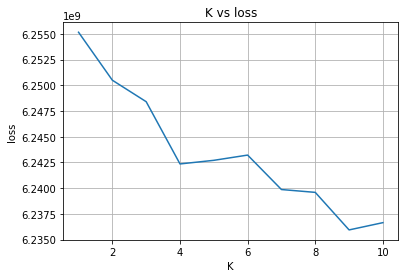

Enter the value of K observed in the above plot: 7


Performing K means on K= 7
Done!


Creating a dataframe with Reviews, Cleaned text and Clusters...
Dataframe is created!


The number of reviews in each cluster is:
2    16994
6    1    
5    1    
4    1    
3    1    
1    1    
0    1    
Name: Clusters, dtype: int64


**********************************************************************




**************************************** Cluster  0 ****************************************


Plot of Word Cloud


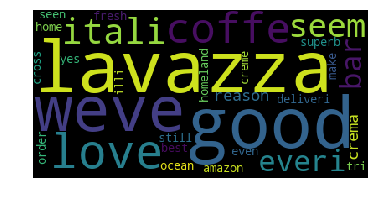





Printing all reviews from cluster 0
0    We love the coffee in Italy and Lavazza seems to be in every bar there - for good reason, its crema is superb! We now order it from Amazon for delivery to our home. And even after it's cross the ocean from its homeland it still is fresh and makes the best creme we've seen! (Yes, we've tried Illy, we like it but it's not as good as Lavazza!)
Name: Reviews, dtype: object








**************************************** Cluster  1 ****************************************


Plot of Word Cloud


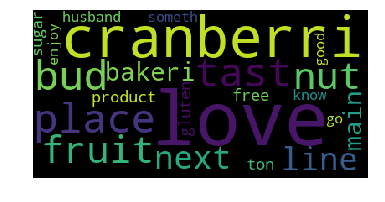





Printing all reviews from cluster 1
1    While cranberry is 1st place for my taste buds, the Fruit and Nut is next in line! Love Bakery and Main products! Love there's not tons of sugar and that my not-so-much gluten free husband enjoys them too! Then you know you have something good going on!
Name: Reviews, dtype: object








**************************************** Cluster  2 ****************************************


Plot of Word Cloud


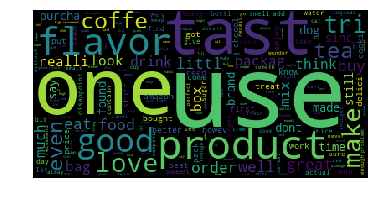





Printing 7 random reviews from cluster 2
2    My cousin-in-law is Thai and she cooked an amazing curry for us.  I had to have the recipe and she said it was really very simple.  Just get the green Mae Ploy curry paste, some Asian basil, and some coconut milk.  A little salt, sugar, chicken, some bamboo shoots and rice were the only other things I would need to make it.  Well, I couldn't believe it was really THAT simple, but it was!  The paste imparts several subtle and delicious flavors to the curry.  Tastes like you slaved for hours.  I never have leftovers when I make this curry.  The paste is so low priced I plan to stock up so I'll always have some on hand.  Plus-- no preservatives, no wierd ingredients.  It's all food stuffs, albiet some of the ingredients I don't recognize... what is a galangal?  Whatever it all is, sure tastes good!
2    This must be a typeo or this is the most expensive pod coffee ever.                                                                       

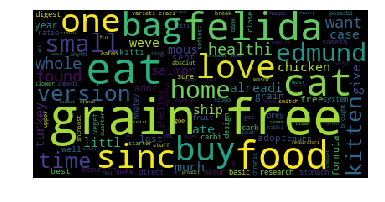





Printing all reviews from cluster 3
3    I adopted my adorable Edmund last year from a shelter. They sent me home with a small bag of Felidae (NOT grain free version) cat and kitten formula as he was a kitten at the time.<br />I am very concerned about eating healthy WHOLE foods, so I of course want the best for my kitty as well. I did research and found that cats' digestive systems are not designed to eat any grains/fruits/vegetables directly, and basically the only carbs they are to eat are what is already in their prey's stomachs (ie: if a mouse ate something carby and the cat ate the mouse they would get a little of whatever was in it). So I wanted to make sure the ratio of his food was as close to what's found in nature as possible, without breaking the bank.<br />He already seemed to really like the Felidae Grain-included version, so as soon as my starter bag ran out I immediately switched to the grain free variety and he has ONLY eaten this ever since I got him - he LOVES it

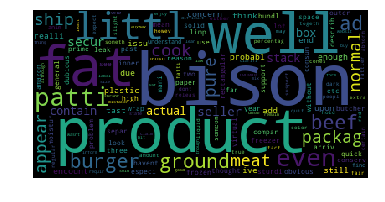





Printing all reviews from cluster 4
4    The seller shipped very quickly and with secure packaging, such that the product all arrived frozen solid. Shipping obviously was a little high, especially for those of us used to having the Amazon Prime shipping deal; but it was reasonable compared to other sellers I had looked into.<br /><br />The actual product packaging is also well thought out. Each rectangular box (which stacks well in the freezer and conserves space) contains two vacuum-packed plastic bundles, each of which contains three bison patties, separated by butcher's paper. The outer boxes are sturdy enough to support and stack well without getting limp from moisture etc., and the inner plastic wrappings appear secure and so far haven't leaked (a problem I've had with many meat products in the past few years).<br /><br />Being someone who has consumed a lot of bison, I was a little dubious upon seeing these patties described as "80/20", which generally means 80% meat and 20% 

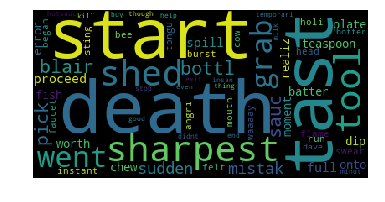





Printing all reviews from cluster 5
5    ok, so i'm not the sharpest tool in the shed. i went to grab the bottle of blair's after death sauce, but picked up sudden death by mistake. i proceeded to spill about a full teaspoon worth onto my plate, then dipped some battered fish into it. i realized my error the moment i started to chew. instantly my mouth felt like it was bursting into flames while angry bees began stinging my tongue. sweat started running from my head like a faucet. holy cow! it is waaaay hotter than dave's temporary insanity!!! taste? it's ok but who buys hotsauce for taste?? even milk didnt help. the good thing though is that it stops killing you in about 15-30 minutes... that is , until it exits the other end!!!
Name: Reviews, dtype: object








**************************************** Cluster  6 ****************************************


Plot of Word Cloud


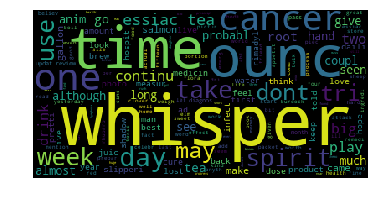





Printing all reviews from cluster 6
6    Update: 3-9-12<br /><br />Tomorrow marks the six-month anniversary of Whisper's attack.  It's hard to wrap my mind around that with an objective perspective.  He's going to get steamed salmon filet to celebrate, and I will celebrate by trying to continue to spread the word about this wonderful tea!<br /><br />As I mentioned earlier, there is a bulk package available through amazon.com that makes 14 gallons for $70.00.  The bulk essiac came yesterday.  It is in four packets of ingredients, with 2lb burdock root, 1lb sheep sorrel, 4oz slippery elm and one ounce Turkish rhubarb root.  Those are the ingredients in both my books on making it yourself.  The Flora product also includes kelp,blessed thistle and red clover, none of which other than red clover are mentioned in either book that I have read, although they suggest adding a bit of bloodroot for hard cancers.<br /><br />I should be able to accurately measure out portions to brew whatever a

In [0]:
k_means(grouped_data,data)

## Observations:

**1.** Through the elbow plot it can be observed that k = 7 can be considered as an optimal K value.

**2.** Cluster 2 has 16994. Rest all clusters have one data point each.

# TFIDF using K Medoids

In [0]:
import pandas as pd
final = pd.read_csv("drive/grouped_data_200.csv")
p = final.groupby('Score')
pos = p.get_group('Positive') #Gets the groups with Positive score
neg = p.get_group('Negative') #Gets the groups with Negative score
pos_2000 = pos.sample(6000) #Gets 30000 reviews of positive and 20000 negative scores
neg_2000 = neg.sample(4000)
grouped_data = pd.concat([pos_2000, neg_2000], ignore_index = True) #This data now contains positive and negative data in order.
grouped_data.dropna(inplace = True) #Drops rows with Nan
grouped_data.reset_index(inplace=True) #Replaces missing indexes
grouped_data.drop(['Unnamed: 0', 'Unnamed: 0.1', 'Score'], axis=1, inplace=True)
grouped_data = grouped_data.sort_values('Time', axis=0, ascending=True, kind='quicksort')
print("The shape of grouped data is {}".format(grouped_data.shape))

The shape of grouped data is (10000, 11)


Observations:
A csv file is imported which consists of 50000 data points. These data points are already sorted on the basis of time.

In [0]:
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2))
vocab_tf_idf = tf_idf_vect.fit_transform(grouped_data['CleanedText'].values.astype('U')) #Converts to a sparse matrix of TF-IDF vectors.

Observations:
TFIDF vectorization is obtained.

In [0]:
data = StandardScaler(with_mean=False).fit_transform(vocab_tf_idf)

Observations:
Data is standardized.

In [0]:
svd = TruncatedSVD(n_components = 1000)
data = svd.fit_transform(data)
print(svd.explained_variance_ratio_.sum())

0.3097542889245451


Observations: Dimensionality reduction is performed and percentage of variance retained is shown.

In [0]:
D = pairwise_distances(data)

Observations: Pairwise euclidean distances are calculated from each point.





========== When number of clusters is 2 ==========




Creating a dataframe with Reviews, Cleaned text and Clusters...
Dataframe is created!


The number of reviews in each cluster is:
0    8792
1    1208
Name: Clusters, dtype: int64


**********************************************************************


The number of Medoids formed are 2


Printing Medoid reviews


This are hard to find and my daughter loves them so I ordered them on Amazon.  She was very happy with this order.




Usually buy this coffee at Costco. Best tasting coffee I've found for the size and price.Normally keep a second bag on hand so we don't run out.






**************************************** Cluster  0 ****************************************


Plot of Word Cloud


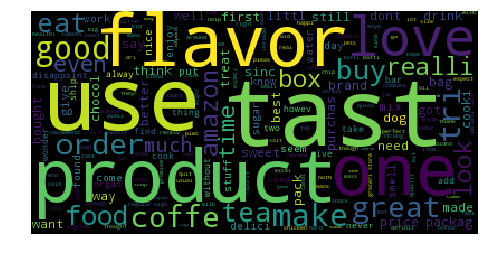





Printing 4 random reviews from cluster 0
4989    I have previously used the Hodgson  9-grain, and the White, and those were/are fine.  But the resulting loaf from this mix came out hard, seemingly already stale, and just falls apart when trying to make/eat my sandwich.  Not very tasty at all either.  Easily, I like the White best (so far), and the 9-grain also good, especially being so healthy.  Will NOT buy this Honey Whole Wheat again nor would I recommend it.  But, who knows, maybe I just got a bad batch?  But will not risk buying another...                                                                                                                                                                                                                                                                                                                                                                                                                                                              

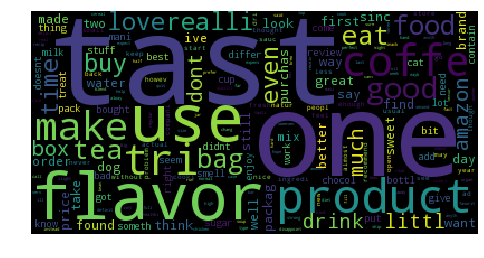





Printing 4 random reviews from cluster 1
5098    I picked these FunBites MiniCongo bones for my puggle.  I am pretty picky about what kind of chews I give her.  Sometimes she has a hard time of chewing them so she gives up and swollows them whole.  This usually makes her sick then.  She was able to chew these bones goodand into small edible pieces.  She would chew on them for hours.  Sometimes she would leave an unfinished chew on the floor.  If I would find it I always picked it up and would hide it from her and then tell her she had to find it.  They must smell really good because she always would.  I will be buying these again for her.                                                                                                                                                                                                                                                                                                                                                              

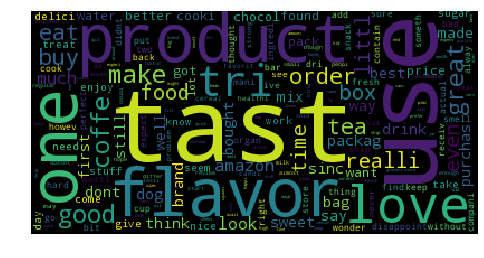





Printing 4 random reviews from cluster 0
5007    After watching a popular health show on TV recently, I decided to order cactus jelly for its health benefits. I did not find much flavor in it. Perhaps the actual " cactus" flavor IS super sweet, or maybe cactus just has little flavor.  I have not compared this brand with any other, similar product, so I cannot say if this is a good or bad representation of what cactus jelly is like. I read an article that described the flavor of prickly pear cactus to " cold green beans", so maybe sweet and bland is better than a green bean taste on my toast! I also doubt that there is as much healthy stuff in this once it is turned into jelly. I will seek a different product in the future.                                                                                                                                                                                                                                                                        

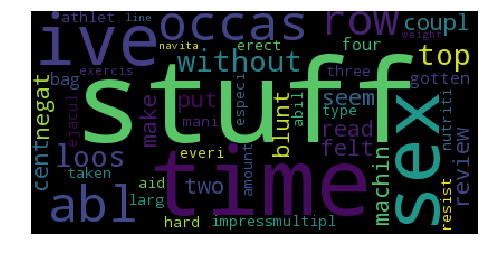





Printing random reviews from cluster 1
1617    After reading a couple of reviews that seemed to be negative I felt i had to put in my two cents.<br /><br />In so doing this i will be blunt. This stuff will make you a sex machine. I've gotten four bags of it and was very impressed every time. On more then a few occasions I've taken a large amount and been able have sex multiple times in a row without loosing hardness. i was able to ejaculate three times in a row without loosing my erection on many occasions.<br /><br />On top of that this stuff is very nutritious and has aided my athletic ability. Especially in resistance type exercise (kettle-bells and weights)<br /><br />Navitas is top of the line stuff too!
Name: Reviews, dtype: object








**************************************** Cluster  2 ****************************************


Plot of Word Cloud


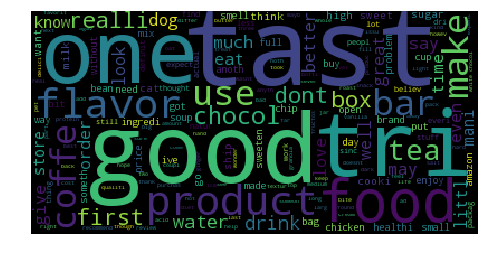





Printing 4 random reviews from cluster 2
4929    I purchased the Starbucks VIA iced coffee on a whim at my local Starbucks due to it being on sale.  I love it.  I was nervous about the taste at first because it's pre-sweetened and while I do like sugar in both my hot and cold coffee, I don't like the excessive amounts that Starbucks packs into its bottled Frappuccinos at the grocery store.  The sugar content in those are outrageous.  The sugar in these instant iced coffees I can take and I would say it's half as sweet as the Starbucks bottled Frappuccinos, but still may be too sweet for some.<br /><br />There's one oddity about the pre-measured amount.  The directions say to add 16oz of water (and possibly ice), but most standard drinking glasses are just at (or slightly above) 16oz, so if you like milk or cream in your coffee you're going to have a hard time putting the amount you want without the glass overflowing.  Perhaps I'm one of the few that drinks iced coffee with cream, m

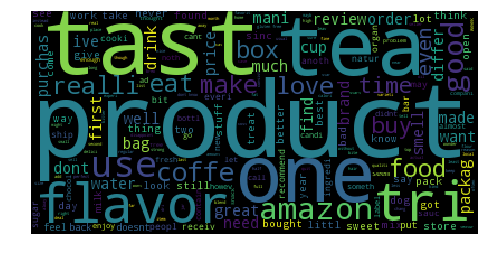





Printing 4 random reviews from cluster 3
4658    Perfect tool for any musicians trying to make recording much easier at an affordable price.<br />Easy to open plastic case, medium sized, durable (People have said that the plastic body feels cheap<br />and feels easy to break but it's not true. The Icicle's plastic body feels durable and won't break if<br />you're not clumsy with it or break it on purpose). I only wished that the "Gain Control" had numbers or indications<br />of levels so I can turn the knob to the correct position for recording and remember it instead of guessing all the time. Sound quality is FLAWLESS! No buzzing noises or anything picked up really...just nice crispy sound recorded through a good quality microphone is all I hear. I hear no difference in it with an Icicle or a Mixer                                                                                                                                                                                          

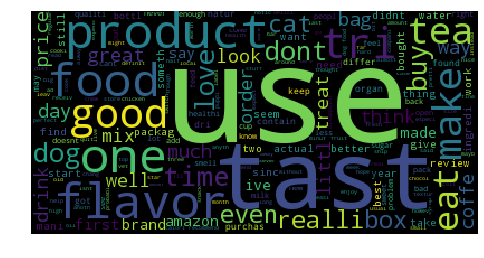





Printing 4 random reviews from cluster 4
5137    I bought this product for my Yorkie and was so disappointed.  First of all, they completely stink.  Second, the sticks are so hard that you have to cut them for a smaller breed with a good quality steak knife (I used my high end stainless Henkles knives and it took some effort).  My puppy (7 1/2 months) has torn through extra durable Nyla bones and is a VERY TOUGH chewer, so I was looking for something he can "play with" and eat which wasn't synthetic.  He didn't know what to do with it even though he seemed to like it as a toy for a minute or two.  But, the smell was overwhelming to me.  I will donate them to a local rescue.  Interestingly enough, I also bought him other Get Naked treats and he didn't care for them either.  Perhaps he just doesn't like this brand.  He does love Blue Buffalo treats, Welness Puppy treats (they also stink, but in a bearable/pate kind of way!) and SoJo's too!                                             

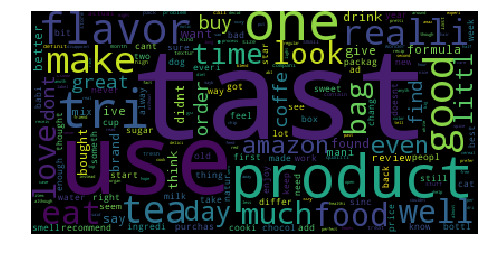





Printing 4 random reviews from cluster 0
5860    This is a Divine Energy $windle. The placebo effect may work fine if you hypnotize easily.<br />The "science", upon which Mr. Trivedi's whole foundation is based, was invalidated.<br />Selling water "Infused with Divine Energy" and claiming it is better for you<br />because it is changed at a molecular level, for the purpose of charging an inflated price,<br />when in fact it is not changed in any way, is a violation of U. S. commerce regulations.<br /><br />The supporting "research" is paid for by the Trivedi foundation at inflated prices<br />from financially desperate sources. Tobacco companies use the same trick.<br /><br />[...]<br /><br />[...]<br /><br />In my opinion Mr. Trivedi has, "A Beautiful Mind (2001)."<br />[...]                                                                                                                                                                                                            
5878

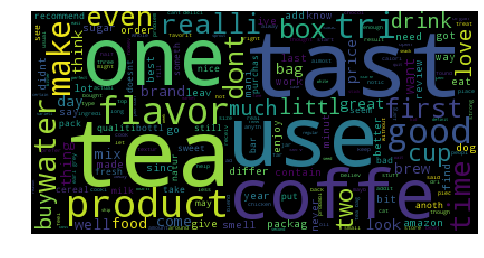





Printing 4 random reviews from cluster 1
5461    Well, it's green. Sort of an electric tree frog green. And opaque. In fact, it looks a lot like bottled margarita mix. And that's pretty much what it tastes like. If you like the taste of low cal margarita mix, you'll probably enjoy this mocktail mix. If you prefer your margaritas with a little more crisp lime-y bite, give this one a pass. I tried it mixed with water and served over ice. Maybe try mixing it with ice in a blender? I'm too lazy to get the blender out for a quick drink and always drink my Margaritas on the rocks.<br /><br />I have also tried the Target 5-calorie Market Pantry on-the-go drink mix in Lime Margarita. It's more transparent (which seems less disturbing somehow) and comes with recipe enhancers right on the box. For example, add fresh lime juice. There's even a recipe for a full fledged Margarita.<br /><br />In comparison, I found the Crystal Light lacking: too artificial tasting with a less than appealing col

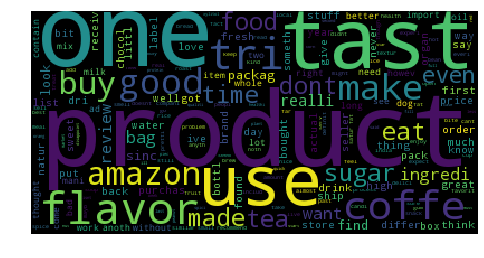





Printing 4 random reviews from cluster 2
5097    Plant showed up about a week after ordering and was covered in a white fungus or mold.. I don't know what to do about it and I don't want to put it near my other plants. I bought it from 9greenbox and I contacted them but am waiting to hear back from them.. The tree does not look like the photo at all and is in a pot that seems way too small for the tree. The tree seems rather weak looking in terms of health and beauty..  I was looking forward to it and was hoping I would get the brussels tree from brussels because the last bonsai I had bought was actually from them and was a great plant.. Do not buy from this seller if you are looking to get the brussels tree..                                                                                                                                                                                                                                                                                     

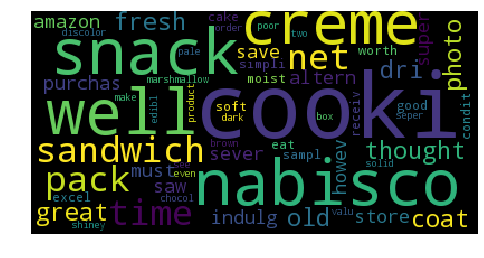





Printing random reviews from cluster 3
2727    <a href="http://www.amazon.com/gp/product/B0005XOQZC">Nabisco Snack Wells Creme Sandwich Cookies 1.7 oz. (Pack of 12) 20.4 oz. net</a><br />I purchased these cookies in the store several times and thought they were a great alternative to other indulgences.  When I saw them on Amazon, I thought it would be a super savings.  However, these cookies must be fresh, or they are simply not worth eating.  The photo above is a very good sample of some very old and dried out cookies.  When they were received in fresh condition, they were excellent, with soft moist cake and marshmallow and a chocolate coating that was a solid, shiney dark brown.  In this photo above you can see a very dried out product with an old and  pale, discolored coating.  I ordered 3 seperate times, 1st box was "great"  other two were not even edible.  1 FOR 3 MAKES THEM A VERY POOR VALUE.<a href="http://www.amazon.com/gp/product/B0005XOQZC">Nabisco Snack Wells Creme Sandw

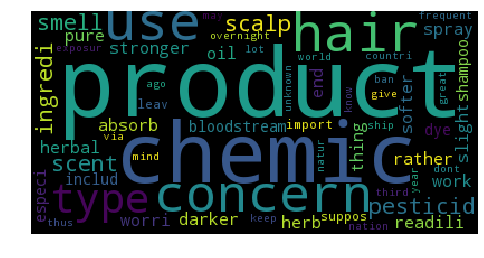





Printing random reviews from cluster 4
3777    I used this once. It works.  My hair is stronger, slightly darker and softer.  My concern is what is in this product?  What types of chemicals or pesticides were sprayed on the herbs?  How pure is the oil?  The product does not have an herbal scent but rather a chemical smell.  What is in this?  I worry because the scalp absorbs products readily and these things end up in your bloodstream....that includes any hair dye and shampoos you use.  The ingredients are especially important here because we are supposed to leave this on overnight  thus giving the scalp a lot of exposure to some unknown ingredients.  Keep in mind that the chemicals and pesticides that were banned in the US years ago are shipped to third world nations and frequently re-imported into this country via these types of products.  I don't know what is in this and it may be great but I am concerned about the smell...it is not a natural scent.
Name: Reviews, dtype: object


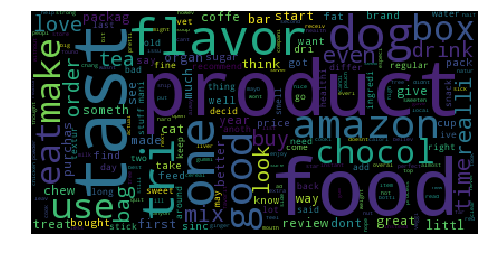





Printing 4 random reviews from cluster 5
4431    Even though I suspect this is ground up beef bouillion it does not matter as it works in a superior way to season grilled steaks on a barbeque. I fully coat the meat and sear at high temps to creat a savory crust. I have never found its equal and do not enjoy most premade seasonings for grilling, however this is an exception. It is also a rare exception to my rule that any ingredient list that reads like a chemical factory was needed to make it should not be eaten. This seasoning only really works well when cooking on the broiler or barbeque, do not bother if frying in a pan, it is not the same. Buon appetito                                                                                                                                                                                                                                                                                                                                           

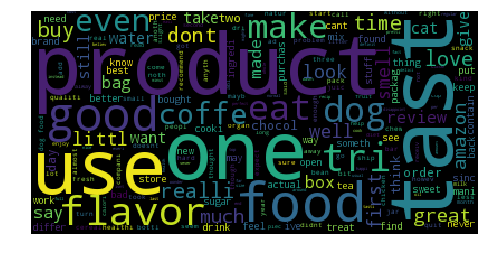





Printing 4 random reviews from cluster 6
5041    Whatever this is, it is NOT 100% coconut oil. I contacted Tropical Traditions, and they said region, and method of preparation can cause variations in taste. However I have been using coconut oil for years and this oil does not behave like any other coconut oil on the planet. It "solidifies" CLEAR!!??  instead of white and has almost no smell, whereas ALL 100% coconut oil is completely white when "solid", and definitely smells like coconut. I was very tempted to send this out to a lab to see exactly what the product in the glass jar was, because I am POSITIVE that this is NOT 100% pure coconut oil. My advice see Coconut Oil expert Bruce Fife's article "How Do You Identify a Good Quality Coconut Oil?" before purchasing.  [...]                                                                                                                            
5044    Amended amendment: Now it's back and shipped by amazon ... I cannot keep up wit

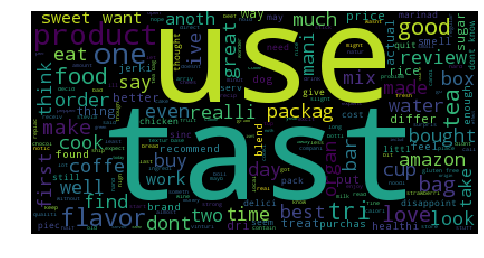





Printing 4 random reviews from cluster 7
4857    $16.80 + $11.10 shipping = $4.65 each.<br /><br />Price at local Lucky market: $2.39 each, no tax.<br /><br />I like this one primarily for the "kick" it gets from the tiny little packet of chili oil that's included.<br /><br />Safeway tends to replace this soup with its inferior house brand (about half the "bite" of the chili oil)...they sell it at half the price, but if it's not what you want, it's not a bargain...is it?<br /><br />So I do want to stress that this is a superior, 5-star product...I love it, I eat it almost daily, I make special trips to buy it, and I often empty Luck's shelves, then go back after they've re-stocked. I am self-employed, I work from home, and MANY times this has "filled the hole" till I can finish what I'm doing and cook a more substantial meal.<br /><br />It is somewhat "healthier" than the standard ramen / cup 'o' noodles product: 2.5 grams fat (4% daily allowance), Sat Fat 2.5 grams (3%), Trans Fat

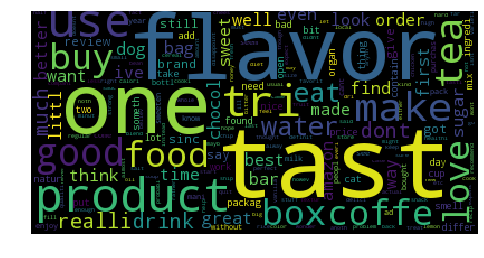





Printing 4 random reviews from cluster 8
4699    first this is what my Dad and i would eat in the mornings, so it's my comfort food, and my children who are adults now find it to be their comfort food too from their mom<br />so that's cool<br />my recipe is: in the bowl you are to eat from, put in 1 cup Kefir yogurt (i use vanilla or blueberry or what ever yogurt is your favorite) and then some blueberries or bananas<br />Peacefully stir cream of wheat until it's at the desired consistency (i like mine on the thicker side)sometimes cooking it in milk makes it even more dreamier<br />pour into waiting bowl stir together and YUM<br />frozen blueberries will thaw immediately other frozen fruit take out the night before<br />All is well in the world when the day begins with Cream of Wheat :)<br />Peace and Grace<br />m                                                                                                                                                                          

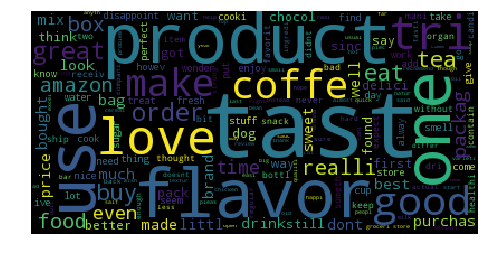





Printing 4 random reviews from cluster 9
5012    you can not buy this in omaha, ne. and i can not drive to new orleans for under 10 dollars what else can i say, it's good coffee                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 
5013    This is supposed to be the best chocolate, I disagree and found Swiss Miss to be more superior.<br />The seller first sent me the wrong order and put the blame on me, in which, was not the case, as proven by their follow up E receipt.  Then it took them more then a month to fill my order.                                                        

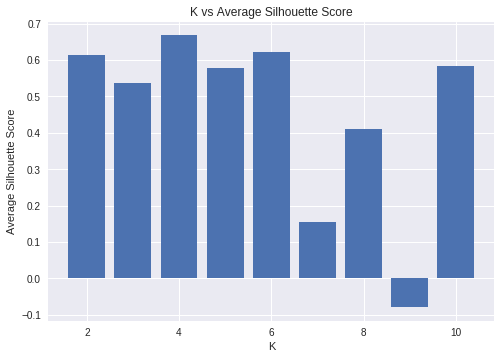

The average Silhouette value of K = 2 is 0.6136800750022063
The average Silhouette value of K = 3 is 0.536459190656099
The average Silhouette value of K = 4 is 0.6673154156085879
The average Silhouette value of K = 5 is 0.5772327512233817
The average Silhouette value of K = 6 is 0.6226981606868719
The average Silhouette value of K = 7 is 0.15512934084243082
The average Silhouette value of K = 8 is 0.41036744638008366
The average Silhouette value of K = 9 is -0.07897795779378063
The average Silhouette value of K = 10 is 0.582341949843812




We can observe that K = 4 has the highest average silhouette score of 0.6673154156085879.






The wordcloud and reviews for optimal K = 4 is plotted as follows.




Creating a dataframe with Reviews, Cleaned text and Clusters...
Dataframe is created!


The number of reviews in each cluster is:
0    9332
3    246 
2    236 
1    186 
Name: Clusters, dtype: int64


**********************************************************************


The number o

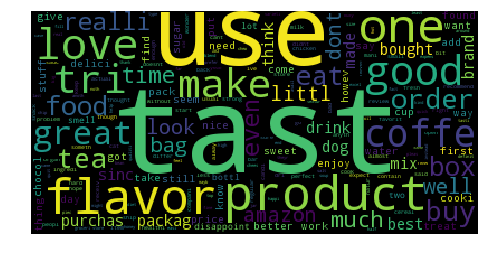





Printing 4 random reviews from cluster 0
5002    this is the only food my dogs with sensitive stomachs could eat without spitting up.  I was so relieved to find it and from all that I read, it gets great reviews across the board. the only draw back is that its not stocked in many local pet stores but now that i can buy it on line, that problem is settled.                                                                                                                                                                                                                                                                                                                                                                                       
5003    These carrots are so rich in color and I love being able to buy a case at a time and have them delivered to my door. Great taste, wonderful for soups and any other dish you would like to create. Cooking can be such fun and the color and taste of these car

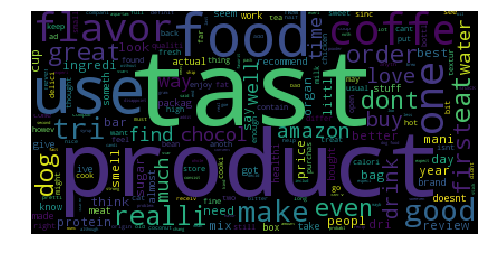





Printing 4 random reviews from cluster 1
5118    I was cruising the aisles of my local "largest retailer in the US" super store one day and spotted the rooster-adorned bottle with the green lid...I had never tasted, noticed, or even heard of this stuff before, but as a hot sauce enthusiast I decided to give it a shot.  Serendipity, baby!  Sriracha (hey Pat Sajak, can I buy another vowel?  how do you pronounce this anyway?!) is now my absolute favorite hot sauce, and I have about 20+ varieties on the shelf at this very moment.  One of the crucial elements to a good hot sauce is the right blend of heat and flavor, and it's a delicate balance.  Some get the flavor but not the heat (Frank's), while others get the heat right but lack flavor (yes I am talking to you, you plethora of generic Habanero-based hot sauces).  Sriracha, however, nails it both ways.  It packs some legitimate kick, but it isn't an endurance contest either.  When it's there, it wakes you up, kicks you in the pants,

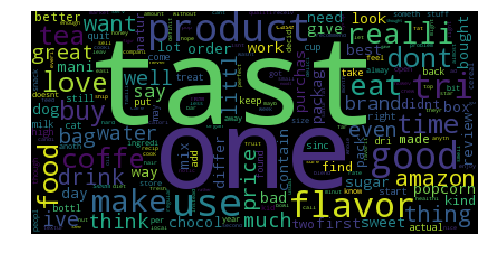





Printing 4 random reviews from cluster 2
4990    I wasn't really optimistic about this sauce; I mean, after all--Taco Bell brand? How gourmet can it be? To my surprise, it's pretty good, and it has potential for several different uses; understand I'm speaking as a somewhat opportunistic cook.<br /><br />If you taste it straight, there is a slight artificial taste to it, but this is not noticeable at all when you combine it with other food. We had it as a taco sauce tonight--that seems to be its intended basic use--and it went well; even the Picky Eater I'm married to liked it. It has the spicy part just about right for those of us who want many foods to be a tad on the hot side, but who also want to be able to enjoy the taste of the food more than the heat of the pepper. It's a bit spicier than I thought it would be, but in a good way.<br /><br />I also put some in a small bowl to use as a dip, and that was also quite good. I think next time I will add some finely chopped tomatoes 

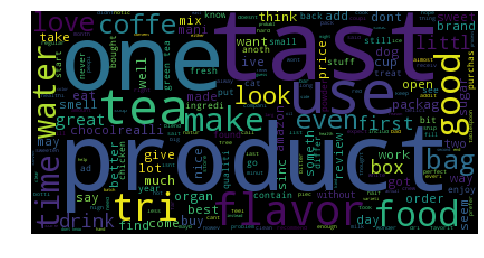





Printing 4 random reviews from cluster 3
4991    This is my 1st time to write a review only because I totally believe in this product. I give this to my 3yo and 1.5yo kids at the onset of their viral infection (colds, cough or fever). This is very effective if given within the 1st few hours of symptoms and taken every few hours for maintenance. They may still have the symptoms but it wont be as bad or you may experience shortened sick days.  This is a must-have in our home! I also take it at the first sign of symptoms and the virus wont push thru.<br /><br />Overall I think it's worth the cost compared to buying medicines and going to the doctor if symptoms persisted w/o <a href="http://www.amazon.com/gp/product/B000VK08OC">Wedderspoon Raw Organic Manuka Honey Active 16+, 17.6-Ounce Jar</a>.                                                                                                                                                                                                  

In [0]:
implement_kmedoids(grouped_data,data,D)

## Observations: 

**1.** Wordcloud and reviews are printed for k values of 2, 5, 10 to get a sense of what's going on  with the data.

**2.** Silhouette scores are plotted for each values of k ranging from 2 to 10. It is observed that k=4 has the highest average silhouette score, hence we declare that k=4 is the best suited number of clusters.

**3.** Since the average value of all the silhouette scores is around 0.45, so almost all k values except 7, 8, 9 can perform reasonably well.

**4.** When k=4, cluster 0 has 9332 elements compared to 186 in cluster 1, 236 in cluster 2 and 246 in cluster 3.

**5.** Four medoids are formed and their reviews are printed above.

#  Average Word2Vec using K Means

In [0]:
import pandas as pd
final = pd.read_csv("grouped_data_200.csv")
p = final.groupby('Score')
pos = p.get_group('Positive') #Gets the groups with Positive score
neg = p.get_group('Negative') #Gets the groups with Negative score
pos_2000 = pos.sample(30000) #Gets 30000 reviews of positive and 20000 negative scores
neg_2000 = neg.sample(20000)
grouped_data = pd.concat([pos_2000, neg_2000], ignore_index = True) #This data now contains positive and negative data in order.
grouped_data.dropna(inplace = True) #Drops rows with Nan
grouped_data.reset_index(inplace=True) #Replaces missing indexes
grouped_data.drop(['Unnamed: 0', 'Unnamed: 0.1','Score'], axis=1, inplace=True)
grouped_data = grouped_data.sort_values('Time', axis=0, ascending=True, kind='quicksort')
print("The shape of grouped data is {}".format(grouped_data.shape))

The shape of grouped data is (49997, 11)


Observations:
A csv file is imported which consists of 200000 data points. These data points are already sorted on the basis of time. We create a new dataframe with over 50000 data points.

In [0]:
list_of_sent=[]
for sent in grouped_data['CleanedText'].values: #Splits sentences into words and stores it in a list
    list_of_sent.append(sent.split())
print(grouped_data['CleanedText'].values[9])
print("*****************************************************************")
print(list_of_sent[9])

enjoy hershey chocol bar time child two favorit hershey dark chocol hershey milk chocol almond combin hershey sweet milk chocol chunk whole almond confectionari landmark opinion enhanc flavor cours bit weight conscious today dont eat hershey chocol bar often childhood doesnt alter rate resound star care eat mani like your concern waistlin
*****************************************************************
['enjoy', 'hershey', 'chocol', 'bar', 'time', 'child', 'two', 'favorit', 'hershey', 'dark', 'chocol', 'hershey', 'milk', 'chocol', 'almond', 'combin', 'hershey', 'sweet', 'milk', 'chocol', 'chunk', 'whole', 'almond', 'confectionari', 'landmark', 'opinion', 'enhanc', 'flavor', 'cours', 'bit', 'weight', 'conscious', 'today', 'dont', 'eat', 'hershey', 'chocol', 'bar', 'often', 'childhood', 'doesnt', 'alter', 'rate', 'resound', 'star', 'care', 'eat', 'mani', 'like', 'your', 'concern', 'waistlin']


Observations: List of words are obtained from the data.

In [0]:
w2v_train=Word2Vec(list_of_sent,min_count=5,size=200, workers=4) #Initialises the Word2Vec model with words occuring more than 5 times.

w2v_train_words = list(w2v_train.wv.vocab) #This gives a dictionary of words which tells about the uniqueness of a word among other things.
print("number of words that occured minimum 5 times ",len(w2v_train_words))
print("sample words ", w2v_train_words[298:315])

number of words that occured minimum 5 times  9640
sample words  ['europ', 'cant', 'prais', 'high', 'believ', 'pleas', 'becom', 'addict', 'hershey', 'chocol', 'bar', 'child', 'favorit', 'milk', 'almond', 'combin', 'sweet']


In [0]:
sent_vectors = [];
sent_list = []
for sent in grouped_data['CleanedText'].values:
    sent_list.append(sent.split())
for sent in sent_list: # For a sentence in the previously created list of sentences
    sent_vec = np.zeros(200) # As word vectors are of zero length, returns an array of size 50 filled with zeros
    i = 0; # Number of words with a valid vector in the sentence/review
    for word in sent: # For each word in a review/sentence
        if word in w2v_train_words:
            vec = w2v_train.wv[word] #Gets the corresponding vector for the word
            sent_vec += vec
            i += 1
    if i != 0:
        sent_vec /= i
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))

49997
200


In [0]:
data = StandardScaler(with_mean=False).fit_transform(sent_vectors)

Observations: Performed standardization on the data.

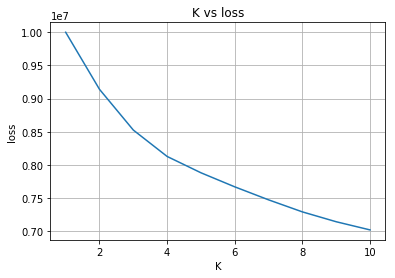

Enter the value of K observed in the above plot: 4


Performing K means on K= 4
Done!


Creating a dataframe with Reviews, Cleaned text and Clusters...
Dataframe is created!


The number of reviews in each cluster is:
3    21258
0    13445
1     7877
2     7417
Name: Clusters, dtype: int64


**********************************************************************




**************************************** Cluster  0 ****************************************


Plot of Word Cloud


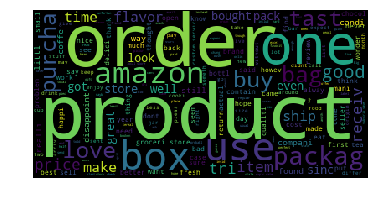





Printing 7 random reviews from cluster 0
0    We have purchased boxes and boxes of Pirate's Booty over the last year.  We used to buy individual bags at Whole Foods but they are expensive and get eaten too quickly.  My 1 year old son just loves them and they are great for his self feeding skills.  My 8 year old loves them as afterschool snacks.  My husband and I enjoy them - but we try not to eat too much since these are snacks afterall and we should not have too much junk food.<br /><br />A few months ago, we shipped a box to my father in law in CA. because he got addicted to them while visiting us.  He took a few bags to visit his mother in Wyoming and she got hooked.  When she could not find any in her very small town, my father in law shipped a box from Amazon to her.  That should last her for a while since she is 96 and lives alone.<br /><br />As you can see, this is addictive so be careful with buying your first box!!  We have also tried Smart Puffs, Cannon Balls and Veggie P

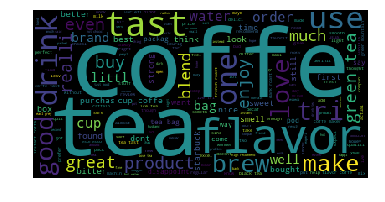





Printing 7 random reviews from cluster 1
1    When I ordered this I thought I was getting plain white tea not a spice variety, don't really care for it.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

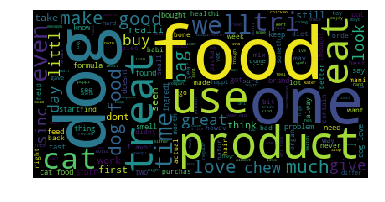





Printing 7 random reviews from cluster 2
2    I have a Norweigan Elkhound and he generally sheds an incredible amount especially in the Spring.  I started him on the Shed Stop 4 weeks ago and it is just amazing how much of a difference I'm seeing.  His shedding has really diminished and his coat looks great.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               



Plot of Word Cloud


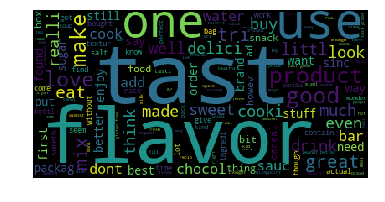





Printing 7 random reviews from cluster 3
3    This cocoa is amazing with its wonderfully strong, sinfully good flavor (I never had the old type in the silver can, so I cannot compare them). Unlike others, I did not notice this to be bitter (and I used a lot in my recipe).<br /><br />When my wife, who *is* Dutch, moved here, she was very disappointed with the cocoa we could find in the stores. I noticed that Ben & Jerry's used alkali-processed cocoa, so I went looking for some and found this, and then made chocolate ice cream with it. Both my Dutch wife and I think it is the best chocolate ice cream ever. My recipe is below.<br /><br />Also, note that the item selling here is for SIX containers of cocoa (I paid $2.37 for one at Central Market). Some reviewers think that the price is for only one container. If you can't find it elsewhere, this is still cheaper than the real Dutch cocoas.<br /><br />Dave's Dutch Chocolate Extreme Ice Cream<br /><br />  2 lg eggs<br /><br />500 ml heav

In [0]:
k_means(grouped_data,data)

## Observations:

**1.** Through the elbow plot it can be observed that k = 4 can be considered as an optimal K value.

**2.** Cluster 0 has 13445, cluster 1 has 7877, cluster 2 has 7417 and cluster 3 has 21258 data points.

# Average Word2Vec using K Medoids

In [0]:
import pandas as pd
final = pd.read_csv("drive/grouped_data_200.csv")
p = final.groupby('Score')
pos = p.get_group('Positive') #Gets the groups with Positive score
neg = p.get_group('Negative') #Gets the groups with Negative score
pos_2000 = pos.sample(12000) #Gets 12000 reviews of positive and 8000 negative scores
neg_2000 = neg.sample(8000)
grouped_data = pd.concat([pos_2000, neg_2000], ignore_index = True) #This data now contains positive and negative data in order.
grouped_data.dropna(inplace = True) #Drops rows with Nan
grouped_data.reset_index(inplace=True) #Replaces missing indexes
grouped_data.drop(['Unnamed: 0', 'Unnamed: 0.1'], axis=1, inplace=True)
grouped_data = grouped_data.sort_values('Time', axis=0, ascending=True, kind='quicksort')
scores=grouped_data['Score']
print("The shape of grouped data is {}".format(grouped_data.shape))

The shape of grouped data is (20000, 12)


Observations:
A csv file is imported which consists of 200000 data points. These data points are already sorted on the basis of time. We create a new dataframe with over 20000 data points.

In [0]:
list_of_sent=[]
for sent in grouped_data['CleanedText'].values: #Splits sentences into words and stores it in a list
    list_of_sent.append(sent.split())
print(grouped_data['CleanedText'].values[9])
print("*****************************************************************")
print(list_of_sent[9])

discov nuesk work restaur use bacon spinach salad bacon good recip invent around open cryopack caus mouth water perfect salti smoki sweet lean fat lean beauti eat nuesk bacon everyth find groceri store bland disappoint
*****************************************************************
['discov', 'nuesk', 'work', 'restaur', 'use', 'bacon', 'spinach', 'salad', 'bacon', 'good', 'recip', 'invent', 'around', 'open', 'cryopack', 'caus', 'mouth', 'water', 'perfect', 'salti', 'smoki', 'sweet', 'lean', 'fat', 'lean', 'beauti', 'eat', 'nuesk', 'bacon', 'everyth', 'find', 'groceri', 'store', 'bland', 'disappoint']


Observations: Get a list of all the words in data.

In [0]:
w2v_train=Word2Vec(list_of_sent,min_count=5,size=200, workers=4) #Initialises the Word2Vec model with words occuring more than 5 times.

w2v_train_words = list(w2v_train.wv.vocab) #This gives a dictionary of words which tells about the uniqueness of a word among other things.
print("number of words that occured minimum 5 times ",len(w2v_train_words))
print("sample words ", w2v_train_words[298:315])

number of words that occured minimum 5 times  6311
sample words  ['dad', 'mom', 'control', 'freak', 'crazi', 'women', 'similar', 'home', 'alon', 'shes', 'terribl', 'neglect', 'daughter', 'depress', 'girl', 'play', 'line']


Observations: Train the word2vec model on the whole data.

In [0]:
sent_vectors = [];
sent_list = []
for sent in grouped_data['CleanedText'].values:
    sent_list.append(sent.split())
for sent in sent_list: # For a sentence in the previously created list of sentences
    sent_vec = np.zeros(200) # As word vectors are of zero length, returns an array of size 50 filled with zeros
    i = 0; # Number of words with a valid vector in the sentence/review
    for word in sent: # For each word in a review/sentence
        if word in w2v_train_words:
            vec = w2v_train.wv[word] #Gets the corresponding vector for the word
            sent_vec += vec
            i += 1
    if i != 0:
        sent_vec /= i
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))

20000
200


Observations: Gets the sentence vectors for all the data.

In [0]:
data = StandardScaler(with_mean=False).fit_transform(sent_vectors)

Observations:Standardize the data.

In [0]:
D = pairwise_distances(data)

Observations: Pairwise euclidean distances are calculated from each point.





========== When number of clusters is 2 ==========




Creating a dataframe with Reviews, Cleaned text and Clusters...
Dataframe is created!


The number of reviews in each cluster is:
1    16643
0    3357 
Name: Clusters, dtype: int64


**********************************************************************


The number of Medoids formed are 2


Printing Medoid reviews


I'm an avid chai drinker--many different varieties of both lattes and straight black tea.  We purchased this product because we noticed that the Cafe Escapes chai lattes--a sweeter, creamier blend--did not actually have much black tea in it, and we still wanted our morning caffeine.  Neither my husband nor I could finish one mug of this stuff, and we will end up getting rid of the box.  It was that awful. There was none of the subtle spice blending--just a watery slightly clove-tasting flavor undercut by a bitterness that almost had hints of coffee. Adding a little milk, as we usually do, didn't help at all.  If yo

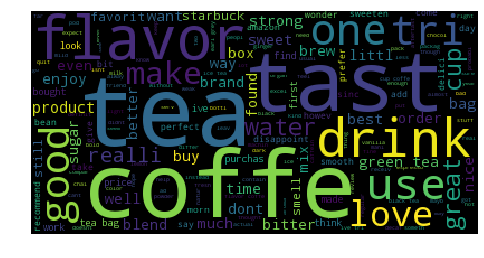





Printing 4 random reviews from cluster 0
9928    This is the best value by far if you use your Keurig Coffee Maker in the morning for a quick cup of coffee just before walking out the door as we do. I prefer Bold and Extra Bold brewed coffee. This collection offered variety and lasted for about 6 weeks.                                                                                                                                                                                                                                                                                            
9931    This is the only 0 calorie sugar that doesn't sicken me when added to my coffee. Note: it doesn't dissolve in cold drinks.                                                                                                                                                                                                                                                                                     

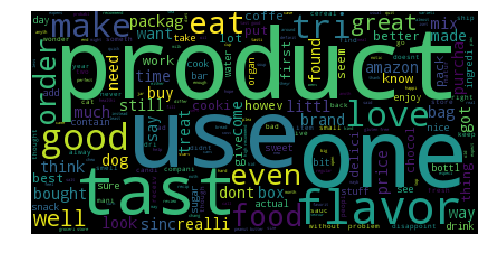





Printing 4 random reviews from cluster 1
10018    in my families opinion these are the best brownies anywhere.  we have tried lots of boxed ones and homemade but these are the best.  don't knot what "Betty" does to them but they are great!                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       
10019    I take a shot of this everyday and have been for 4 months. I can't say medically or scientifically how much it helps

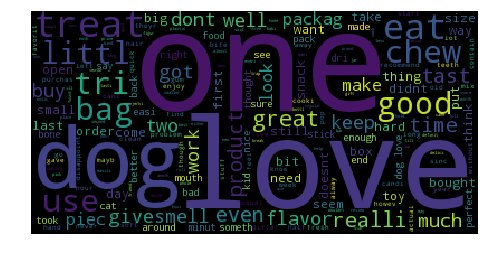





Printing 4 random reviews from cluster 0
10087    I'll just say these taste fine if you can stand pine mouth for weeks to come... Now I am stuck with 5 more packs of these... I should get a bird.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   
10088    Picked up a bag of this on recommendation from the lady at our neighborhood pet store.<br /><br />This litter consists of large sawdust pellets that are too big to fall through the

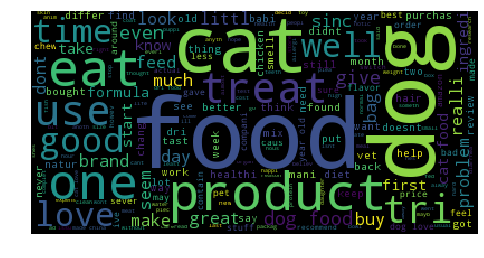





Printing 4 random reviews from cluster 1
10576    Wellness is among the best cat foods out there.  It is grain-free and it has ingredients of high quality. There are no meat by-products.  My only caveat is that Wellness' products with fish are not so good.  Quite frankly, cats don't eat fish in the wild, so their digestive systems are not designed for consumption of fish.  That being said, this is a fantastic specific product.  The meat is fresh, and I know my cat loves it.  I adopted my cat (he is five), and within weeks his coat was softer, the colors more vivid and I began seeing markings and colors I never saw before.<br /><br />On another note, I can't help but take a dig at one of the worst, if not THE worst, foods out there...Science Diet.  Take a read on the ingredients.  In doing so, you will the natural, very high grade, pure ingredients of Wellness contrasted with the low grade, artificial, even mysterious ingredients of Science Diet food.  Hill's chooses the name "Scien

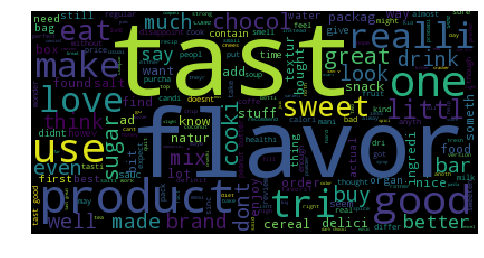





Printing 4 random reviews from cluster 2
9749    Supposedly increases milk production? Yeah, I didn't see a difference after drinking this for a good 3+ weeks. Aside from that, it doesn't smell or taste very good. Very herbal medicine-like.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

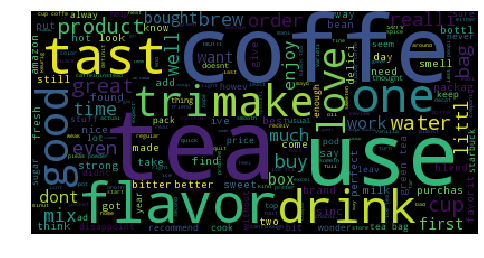





Printing 4 random reviews from cluster 3
10342    This was my second Saeco, but will be my last. This machine was poorly fitted together when built, broke twice within the warranty period, but, only repaired, sort of, once. It'd be considered a lemon if it was a car, and customer service has been rude, lying, insulting. I will listen to it squeak out perhaps it's last dying cup, gladly toss it in the garbage, and buy a real coffee machine next time. Buyer beware.
10343    I have used this tea for 2 of my 3 pregnancies. It's a little hard to 1st get used to the taste but now I love it. It helps strengthen the uterus. I started drinking it in my 3rd trimester and drank it for a few weeks postpartum as well.                                                                                                                                                                                    
10356    Flavorful and full-bodied, this tea is made from green tea leaves flavored with a hint of po

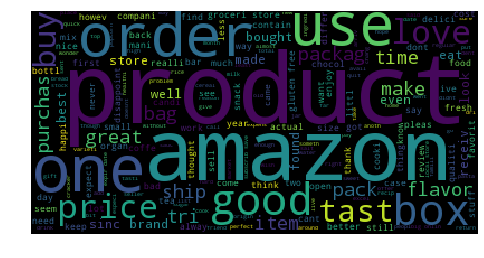





Printing 4 random reviews from cluster 4
9864    My nephew loves this candy but it's only sold in specialty stores.  I bought this for his 12th birthday so he could have his own supply for the school year.  He was thrilled with it.  It was packaged nicely and arrived undamaged, made a great birthday gift!                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            
9871    great snack, bought the pack 

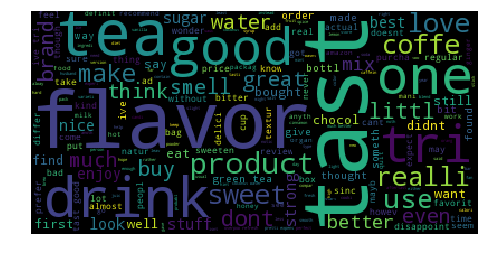





Printing 4 random reviews from cluster 0
10440    I'm good at making mac & cheese.  But this?  I could tell it would be a sub-par meal while the pasta was still in the pot.  It's just... OFF.  It smelled odd, tasted odd, even after a couple of my usual enhancers- honey-mustard sauce on part, real bacon bits in another.  I finished, but mostly because I don't waste food.  I won't be buying this again.<br /><br />Maybe if your kid has a cold and can't smell and taste things very well, they might tolerate it.
10453    Do not buy on the go RTD. The taste is horrible. Suck it up and pay the little bit extra for the 17oz lean body.                                                                                                                                                                                                                                                                                                                                                             
10454    I tr

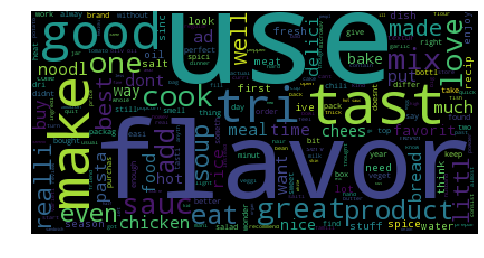





Printing 4 random reviews from cluster 1
9410    Idahoan are best flavor instant mashed potatoes.  Also good for thickening soups, especially cream soups made with skim milk rather than cream.                                                                                                                                                                                                                                                                                                                     
9431    This is a great food for the dieters, as far as tast it will be what you make out of it !!! Just make sure you read on how to make them "cooked" :)  before you disappoint your self with a fish smell it naturaly have, and could almost wash off with water. It is a great product 0 cal 0 fat 0 everything, and if you can just add a 20-100 cal of tast to them of anything you like to eat,it will fill you up for dinner !!! 100 cal Dinner !!!Great for diet!
9448    Excellent substition for 

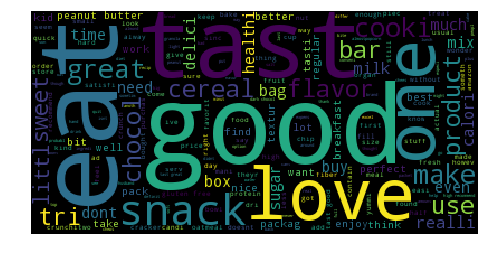





Printing 4 random reviews from cluster 2
9124    One of the best cereals I've ever tasted. I'm not a big cereal eater, but I can have 2 bowls of this in one sitting. Personally, I can't eat the same flavor over and over again, so that's why most cereals are a no-go for me. But in FiberPlus Berry Yogurt Crunch, that's not the case. The granola clusters and yogurt balls make it interesting.<br /><br />Buying the 3-pack of this cereal comes in really handy, as my husband and I both eat a lot of it, and we save a lot of money by doing it this way.                                                                                                                                                                                                                                                                                                                                                                                                                                                               

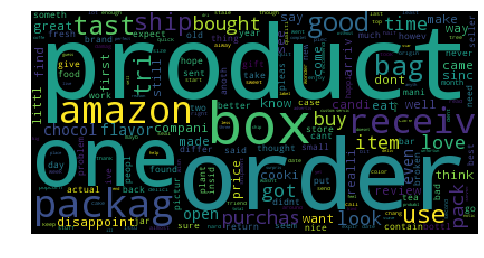





Printing 4 random reviews from cluster 3
10868    Well, it looks like they took my review off from last week. So, I will re-enter it. After buying 3 1 lb bags for all uses, my family decided to try a handful and everyone stated their throat burned including me. The company said they will refund my money and said they don't have preservatives in them. But, something is wrong. Your throat shouldn't burn after eating a handful of walnuts. Guess that is why they are such a good bargain.                                                                                              
10872    I bought this item while browsing for Pecan Sandies. I'm a senior who likes to keep "stocked up". Also I'm on low end of Soc.Sec. and don't have a car. I loved these cookies and am subscribing to them. The cookies arrived in 6 12-oz packages and not a broken cookie in the bunch.                                                                                                                              

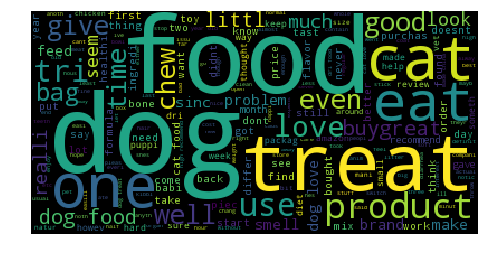





Printing 4 random reviews from cluster 4
10344    My dog loves these treats. He waits for them every night. I did see an improvement w his teeth! He was having a bit of sensitivity w his teeth because he is old. it has been over 3 weeks of giving him these and now he uses his teeth move.                                                                                                                                                                                                                                                             
10357    I had switched to this food due to the possibility of another food intolerance in one of my cats.  My cats have never been picky eaters, but none of them were particularly thrilled with this food. They used to run to mealtimes but that basically ended with this food and it was like pulling teeth to get one of them to eat at all.  I was not a fan either--the food basically crumbled to dust, and who wants to eat powder? I switched them to the 

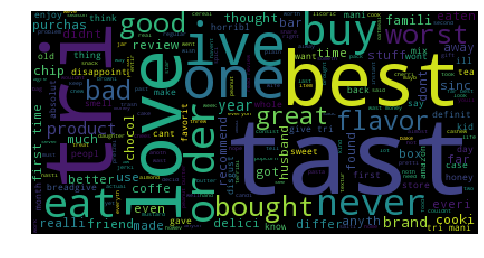





Printing 4 random reviews from cluster 5
9377    Got these for my son's bday party, They are very pretty to look at, but I was disappointed that it has no real great taste...                                                            
9395    This steak sauce is the best I've ever had. Delicious taste with just enough kick. Kind of expensive, but worth every penny. I've tried many others but always come back to Ring of Fire!
9565    I've tried many kinds of protein bars and these are by far the worse tasting.  I'd never buy them again.                                                                                 
9587    This Legacy Oat flour was the worst tasting I've ever tried.  Leaves such a bad after taste.  I can't even use it.                                                                       
9704    I have tried several different brands. This one is the best with consistency of quality and flavor. I love them!                                                           

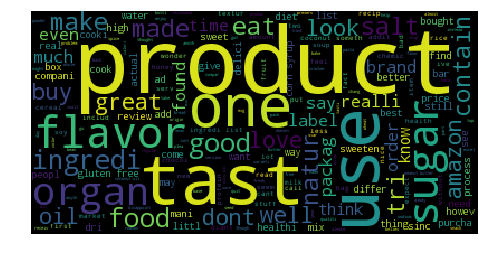





Printing 4 random reviews from cluster 6
9731    This was the first time I tried purchasing a food product over the internet, and as feared I was sent something other than what was pictured.<br /><br />This package contains Chia Seed POWDER, which I assume is ground up seed (or the remainder from packaging whole seeds) that you have no way of identifying whether or not has additional filler.<br /><br />Not going to bother returning a $7 product, but just disappointed when the page advertises whole seeds.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

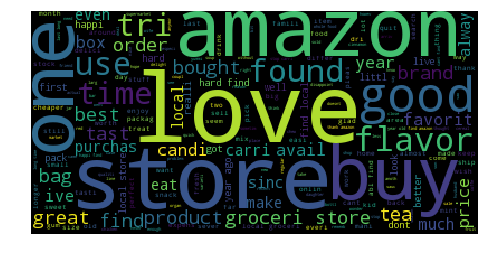





Printing 4 random reviews from cluster 7
9074    I love these things. They are the exact same thing I would always buy at a German specialty store around 40 years ago. They are salty licorice candy - if you like black licorice you would probably love these.                                                                                                                                                                                                                                           
9082    It's a great project, my daughter has been using this for the past 3 years and even though it's expensive it works for us...                                                                                                                                                                                                                                                                                                                               
9097    Had these as part of an appetizer at a Flor

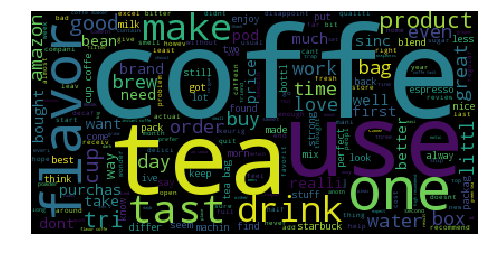





Printing 4 random reviews from cluster 8
10467    This is a great mid morning coffee, best for drinking after I have already had my jet fuel. It is a medium strength coffee, but has great aroma and flavor.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
10470    It seemed like a good idea to get your Vitamin B for the day in your swee

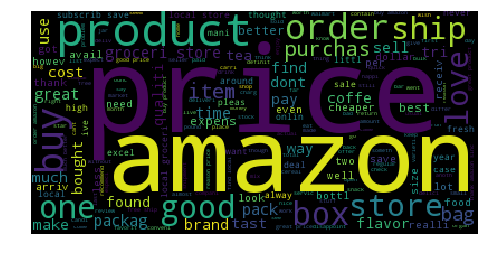





Printing 4 random reviews from cluster 9
9358    Organicville is simply amazingly delicious ketchup. It is sweetened with agave which is much sweeter than sugar but better for you because of its low-glycemic index. I wanted to buy a 4-pack of Organicville Ketchup from Amazon.com hoping that it would be cheaper. It's not! It's a lot cheaper at my local supermarket!
9362    SHIPPING WAS PROPMPT, BUT WHEN I OPENED THE BAG & TRIED IT, IT WAS ALL STALED. I COULD NOT EAT IT. DO NOT BUY THIS ITEM.                                                                                                                                                                                                     
9363    LOVE Gu and love GU roctane.  Price is right and shipment was super fast.  So easy to buy on Amazon THanks!                                                                                                                                                                                            

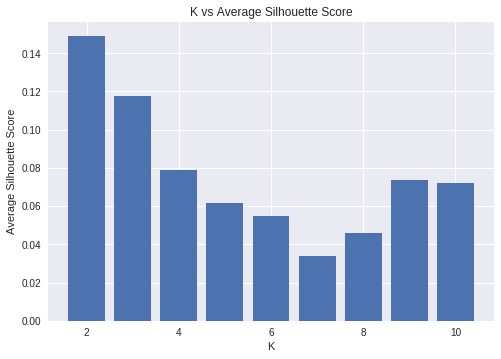

The average Silhouette value of K = 2 is 0.14893290330283254
The average Silhouette value of K = 3 is 0.11767534666359693
The average Silhouette value of K = 4 is 0.07901002335614035
The average Silhouette value of K = 5 is 0.06173425105982789
The average Silhouette value of K = 6 is 0.054991779708370214
The average Silhouette value of K = 7 is 0.03371072619218367
The average Silhouette value of K = 8 is 0.04594872763232674
The average Silhouette value of K = 9 is 0.0737712611151268
The average Silhouette value of K = 10 is 0.07219543981423751




We can observe that K = 2 has the highest average silhouette score of 0.14893290330283254.




The wordcloud and reviews for K = 2 is already output above.


In [0]:
implement_kmedoids(grouped_data,data,D)

Observations: 

**1.** Wordcloud and reviews are printed for k values of 2, 5, 10 to get a sense of what's going on  with the data.

**2.** Silhouette scores are plotted for each values of k ranging from 2 to 10. It is observed that k=2 has the highest average silhouette score, hence we declare that k=2 is the best suited number of clusters.

**3.** Since the average value of all the silhouette scores is around 0.07, so almost all k values except 5, 6, 7, 8 can perform reasonably well.

**4.** When k=2, cluster 1 has 16643 elements compared to 3357 in cluster 0.

**5.** Two medoids are formed and their reviews are printed above.

# TFIDF Word2Vec using K Means

In [0]:
import pandas as pd
final = pd.read_csv("grouped_data_200.csv")
p = final.groupby('Score')
pos = p.get_group('Positive') #Gets the groups with Positive score
neg = p.get_group('Negative') #Gets the groups with Negative score
pos_2000 = pos.sample(30000) #Gets 30000 reviews of positive and 20000 negative scores
neg_2000 = neg.sample(20000)
grouped_data = pd.concat([pos_2000, neg_2000], ignore_index = True) #This data now contains positive and negative data in order.
grouped_data.dropna(inplace = True) #Drops rows with Nan
grouped_data.reset_index(inplace=True) #Replaces missing indexes
grouped_data.drop(['Unnamed: 0', 'Unnamed: 0.1'], axis=1, inplace=True)
grouped_data = grouped_data.sort_values('Time', axis=0, ascending=True, kind='quicksort')
scores=grouped_data['Score']
print("The shape of grouped data is {}".format(grouped_data.shape))

The shape of grouped data is (49997, 12)


Observations:
A csv file is imported which consists of 200000 data points. These data points are already sorted on the basis of time. We create a new dataframe with over 50000 data points.

In [0]:
list_of_sent=[]
for sent in grouped_data['CleanedText'].values: #Splits sentences into words and stores it in a list
    list_of_sent.append(sent.split())
print(grouped_data['CleanedText'].values[9])
print("*****************************************************************")
print(list_of_sent[9])

buy neighborhood supermarket realli best soymilk best flavor best textur everyth
*****************************************************************
['buy', 'neighborhood', 'supermarket', 'realli', 'best', 'soymilk', 'best', 'flavor', 'best', 'textur', 'everyth']


In [0]:
w2v_train=Word2Vec(list_of_sent,min_count=5,size=200, workers=4) #Initialises the Word2Vec model with words occuring more than 5 times.

w2v_train_words = list(w2v_train.wv.vocab) #This gives a dictionary of words which tells about the uniqueness of a word among other things.
print("number of words that occured minimum 5 times ",len(w2v_train_words))
print("sample words ", w2v_train_words[298:315])

number of words that occured minimum 5 times  9580
sample words  ['color', 'vibrant', 'amount', 'goe', 'far', 'thing', 'like', 'point', 'roast', 'drink', 'northern', 'itali', 'espresso', 'vienna', 'southern', 'use', 'french']


Observations:
Word2Vec model is built. We can see the number of times a word occured minimum 5 times.

In [0]:
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2))
vocab_tf_idf = tf_idf_vect.fit_transform(grouped_data['CleanedText'].values)
tfidf_feat = tf_idf_vect.get_feature_names()
dictionary = dict(zip(tfidf_feat, list(tf_idf_vect.idf_)))

Observations:
We build the vocabulary of TF-IDF on train data and obtain the vectors.

In [0]:
sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
sent_list = []
for sent in grouped_data['CleanedText'].values:
    sent_list.append(sent.split())
for sent in sent_list: # for each review/sentence 
    sent_vec = np.zeros(200) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_train_words:
            try:
                vec = w2v_train.wv[word] # obtain the tf_idfidf of a word in a sentence/review
                tf_idf  = dictionary[word]*sent.count(word)
                sent_vec += (vec * tf_idf)
                weight_sum += tf_idf
            except:
                pass
    if weight_sum != 0:
        sent_vec /= weight_sum
    sent_vectors.append(sent_vec)
    row += 1
print(len(sent_vectors))
print(len(sent_vectors[0]))

49997
200


In [0]:
data = StandardScaler(with_mean=False).fit_transform(sent_vectors)

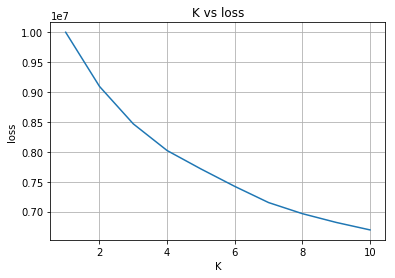

Enter the value of K observed in the above plot: 3


Performing K means on K= 3
Done!


Creating a dataframe with Reviews, Cleaned text and Clusters...
Dataframe is created!


The number of reviews in each cluster is:
0    21984
2    21176
1    6837 
Name: Clusters, dtype: int64


**********************************************************************




**************************************** Cluster  0 ****************************************


Plot of Word Cloud


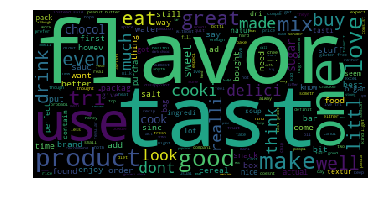





Printing 7 random reviews from cluster 0
0    The label on  Frank's Hot Sauce says "The Perfect Blend of Flavor and Heat" and I must say this is an accurate description of the product.<br /><br />Frank's Hot Sauce is outstanding.  It's a Cheyenne Pepper based hot sauce that is not too hot, not too sweet, but has just a perfect blend of "flavor and heat."  It's not like Tobasco sauce which is very hot and you sprinkle on items.  It's a different kind of sauce (I love Tobasco).  Frank's is a hot sauce you can use more liberally to your liking because, while it's hot, it's not so hot you can't really dig into it and enjoy the rich flavor and spices.<br /><br />I like to use this sauce to dip chicken tenders in, but you can also use it too cook buffalo wings, put it on eggs, French fries, burgers, whatever you like.<br /><br />This size really is way too small to purchase.  If you like hot sauce you will be done with this size bottle in no time and kick yourself for not buying a larger

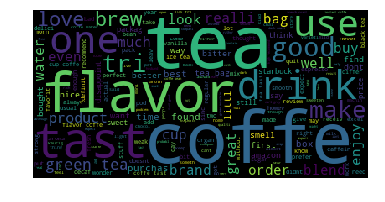





Printing 7 random reviews from cluster 1
1    I just got the Padfilter and the first time I tried it the coffee was a little weak. But, that was my fault because I packed the coffee in there. After that I filled it, but with room to spare. To better understand, fill it and close it, if you can shake it and hear the coffee moving around, then you have it right. After doing it that way from the second time on, I have had one great cup after another! And yes, you do get the creamy foam! I have been using Starbucks Sumatra and it comes out tasting great! The only reason for not giving it 5 stars.....Because if you have a big mug, you have to fill both pods and run the machine twice. But that's just me.                                                                                                                                                                                                                                                                   
1    Sample this box of 10 te

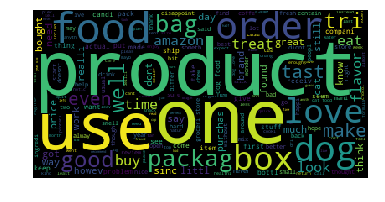





Printing 7 random reviews from cluster 2
2    Although I like to consider myself open to 'cultural cuisine', I found myself spitting this stuff out - after paying about $6 for it at a international marketplace.  My significant other did the same.  I like salty stuff, and I love licorice, but this was just plain nasty.  Not only was it too salty, but it had a terrible rubbing-alcohol-type flavor that went up to my nose and made me wonder if perhaps the candy had been tampered with or manufactured incorrectly.  I went online and read some other reviews...other people have had similar experiences.  I guess it's one of those acquired tastes that has to be developed early.  Oh, those Dutch!! I love 'em (but hate this "candy")!
2    The is a great tea .... unfortunatly this is not carried by all food markets.                                                                                                                                                                                      

In [0]:
k_means(grouped_data,data)

## Observations:

**1.** Through the elbow plot it can be observed that k = 3 can be considered as an optimal K value.

**2.** Cluster 0 has 21984, cluster 1 has 6837, cluster 2 has 21176 data points.

# TFIDF Word2Vec using K Medoids

In [0]:
import pandas as pd
final = pd.read_csv("drive/grouped_data_200.csv")
p = final.groupby('Score')
pos = p.get_group('Positive') #Gets the groups with Positive score
neg = p.get_group('Negative') #Gets the groups with Negative score
pos_2000 = pos.sample(12000) #Gets 30000 reviews of positive and 20000 negative scores
neg_2000 = neg.sample(8000)
grouped_data = pd.concat([pos_2000, neg_2000], ignore_index = True) #This data now contains positive and negative data in order.
grouped_data.dropna(inplace = True) #Drops rows with Nan
grouped_data.reset_index(inplace=True) #Replaces missing indexes
grouped_data.drop(['Unnamed: 0', 'Unnamed: 0.1'], axis=1, inplace=True)
grouped_data = grouped_data.sort_values('Time', axis=0, ascending=True, kind='quicksort')
scores=grouped_data['Score']
print("The shape of grouped data is {}".format(grouped_data.shape))

The shape of grouped data is (20000, 12)


In [0]:
list_of_sent=[]
for sent in grouped_data['CleanedText'].values: #Splits sentences into words and stores it in a list
    list_of_sent.append(sent.split())
print(grouped_data['CleanedText'].values[9])
print("*****************************************************************")
print(list_of_sent[9])

ive tri mani packag chai product liquid dri soy etc actual enjoy chai nation chain coffe store dont care coffe receiv gift excel must made water sweeten littl tast horribl what even better caffein free usual drink night instead coffe
*****************************************************************
['ive', 'tri', 'mani', 'packag', 'chai', 'product', 'liquid', 'dri', 'soy', 'etc', 'actual', 'enjoy', 'chai', 'nation', 'chain', 'coffe', 'store', 'dont', 'care', 'coffe', 'receiv', 'gift', 'excel', 'must', 'made', 'water', 'sweeten', 'littl', 'tast', 'horribl', 'what', 'even', 'better', 'caffein', 'free', 'usual', 'drink', 'night', 'instead', 'coffe']


In [0]:
w2v_train=Word2Vec(list_of_sent,min_count=5,size=200, workers=4) #Initialises the Word2Vec model with words occuring more than 5 times.

w2v_train_words = list(w2v_train.wv.vocab) #This gives a dictionary of words which tells about the uniqueness of a word among other things.
print("number of words that occured minimum 5 times ",len(w2v_train_words))
print("sample words ", w2v_train_words[298:315])

number of words that occured minimum 5 times  6345
sample words  ['creami', 'citi', 'theyr', 'thick', 'starchi', 'put', 'blender', 'anyth', 'resembl', 'gravi', 'american', 'outsid', 'south', 'realli', 'sit', 'shelf', 'second']


Observations:
Word2Vec model is built. We can see the number of times a word occured minimum 5 times.

In [0]:
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2))
vocab_tf_idf = tf_idf_vect.fit_transform(grouped_data['CleanedText'].values)
tfidf_feat = tf_idf_vect.get_feature_names()
dictionary = dict(zip(tfidf_feat, list(tf_idf_vect.idf_)))

Observations:
We build the vocabulary of TF-IDF.

In [0]:
sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
sent_list = []
for sent in grouped_data['CleanedText'].values:
    sent_list.append(sent.split())
for sent in sent_list: # for each review/sentence 
    sent_vec = np.zeros(200) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_train_words:
            try:
                vec = w2v_train.wv[word] # obtain the tf_idfidf of a word in a sentence/review
                tf_idf  = dictionary[word]*sent.count(word)
                sent_vec += (vec * tf_idf)
                weight_sum += tf_idf
            except:
                pass
    if weight_sum != 0:
        sent_vec /= weight_sum
    sent_vectors.append(sent_vec)
    row += 1
print(len(sent_vectors))
print(len(sent_vectors[0]))

20000
200


In [0]:
data = StandardScaler(with_mean=False).fit_transform(sent_vectors)

In [0]:
D = pairwise_distances(data)





========== When number of clusters is 2 ==========




Creating a dataframe with Reviews, Cleaned text and Clusters...
Dataframe is created!


The number of reviews in each cluster is:
0    12501
1    7499 
Name: Clusters, dtype: int64


**********************************************************************


The number of Medoids formed are 2


Printing Medoid reviews


We learned about this product from friends and loved it.  Later, we visited the Messina Hoff Winery in College Station/Bryan, Texas, where they used it during wine tasting and also sold them for $50 for the aerator and $55 for the tower that holds the aerator. We researched the product and although there are different ones out there that claim to serve the same purpose, the Venturi seems to be the best for the job, which is probably why the winery prefers it to make their wines taste even better. People were purchasing them frequently at the winery because they, too, were impressed with the improvement of the wine 

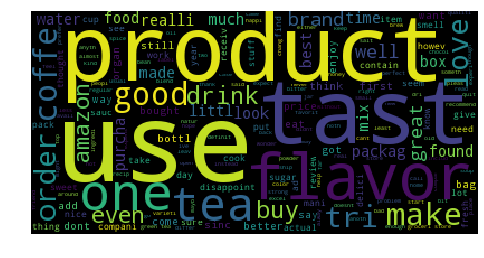





Printing 4 random reviews from cluster 0
10187    As a family, we started using Cytomax while training for a backpacking trip into the Grand Canyon, back in the Winter/Spring of 2006.  It was recommended to us by the owner of the local high-end bicycle store.<br /><br />The flavor is smooth, and the drink doesn't leave you with that cotton-mouth feeling that even water can produce, especially when it's hot.  I'll warn you up front, this stuff is addicting.  Once your body gets a taste of it, you WILL NOT exersise again without it. In fact, just the smell of the powder while you're mixing it will trigger a pavlovian response that you suddenly have the urge to go do something strenouos, and, you just want a huge drink of Cytomax.  Weird, I know, but true.<br /><br />About the flavors.  We've found the Cool Citrus to be the smoothest, truest, taste.  Sort of a nice lemonade flavor.  To us, all of the other flavors have some sort of a weird before, or after taste.  For example, the Tan

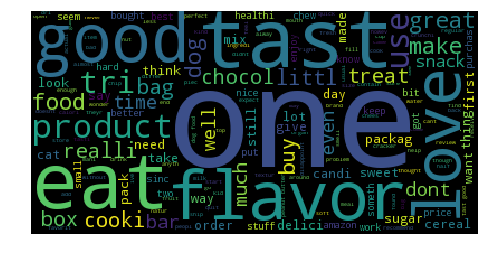





Printing 4 random reviews from cluster 1
9709    Win-win solution for training treats when I forgot to make a new batch.  These are semi-moist so the dog doesn't have to chew them, and he loves them so they do make working worth it for our dog.                                                                                                                                                                                                                                                                                                             
9712    These took FOREVER to ship and when they did arrive they were not as durable as advertized.  Was looking for a bone to keep our dogs busy, these were more like a snack.                                                                                                                                                                                                                                                                                  

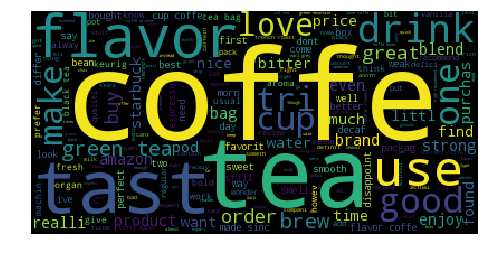





Printing 4 random reviews from cluster 0
9545    I buy this and a Kona blend for my brewer. I have tried many other brands and flavors but I always come back to this one. I "drown" my coffee with flavored coffeemates but still get a coffee taste from this one.                                                                                                                                                                                                                                                                                                                                                                                                                                     
9550    For years while living in New Hampshire my hubby enjoyed his morning Green Mountain Coffee.  After relocating to North Carolina it was difficult to find and now that I've order lots of K-Cups - he is smiling and enjoying his Green Mountain coffee!!                                                          

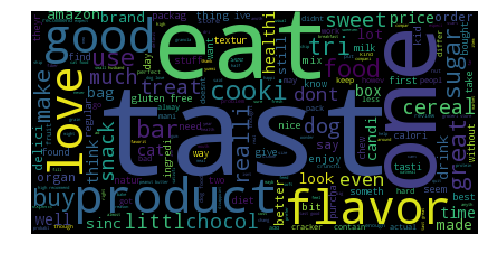





Printing 4 random reviews from cluster 1
9320    Tastes great.  Good price.  I eat them after lunch when I'm craving something sweet.  Donuts and pastries mess up your diet, but these are great to get the sugar you crave in a low calorie treat.  I get them through subscribe and save, best way to go.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

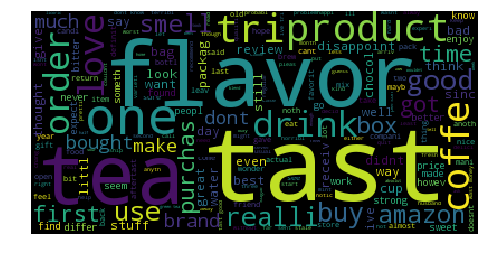





Printing 4 random reviews from cluster 2
10706    This selection from Green Mountain is so far our favorite.  The breakfast time aroma of real french toast with a hearty taste in a full bodied coffee.  We can't keep it around - too popular.  It is also very hard to find.  Amazon has come through for us .... can't find it any other place.                                                                                                                                                                                                                                                                                                                                                                                                                                                               
10708    This package is amazing! So far I have tried 8-10 different flavored coffee k-cups and they have been great!<br /><br />Don't listen to that one post about the K-cups being expired! I got them and the

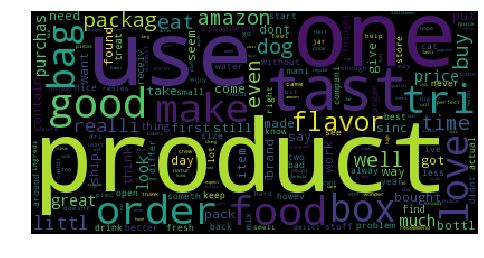





Printing 4 random reviews from cluster 3
10418    This is a mayo my hubby and I can agree on.  I prefer the cheaper stuff from Trader Joes but he likes "regular" mayo from the grocery store.  This is our good compromise - less fat and still a taste like "regular" mayo.  But its mayo - its not made for daily consumption!
10422    My cats really love Holistic Select canned food. I have tried other quality brands and often they choose not to eat them for whatever reason. I have not had that happen with Holistic Select. I read the ingredients and was pleased - which always determines my purchases.  
10427    What can I say? The cats eat it and they do not puke it back up.  So in my book that is good!                                                                                                                                                                                  
10428    horrible price on these...  comes to .92 cents per cup. there has to be a better place to get these tha

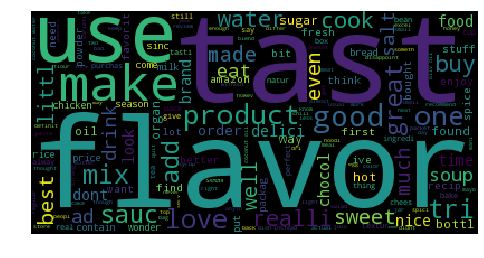





Printing 4 random reviews from cluster 4
9733    Our gluten-free family of five has tried this several times and everyone seemed to lose their appetite when this was prepared.  The cheese sauce comes in a packet that you squeeze on the noodles.  Everyone agreed that the sauce is too cheesy, thick, and the flavor is not as good as other brands/styles.  Mac & Cheese is a staple in our house, but we won't order this one again.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             
9740    This is my favorite

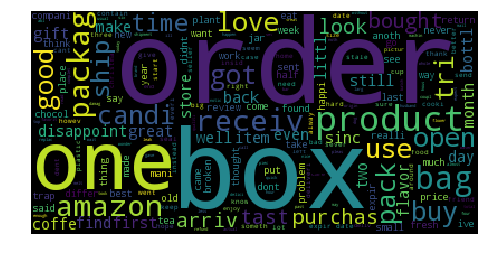





Printing 4 random reviews from cluster 0
10532    I ordered 18 bags of York Pieces for wedding favors, half of the bags were melted and Amazon has a no return policy on food items. I would not order food products from a online vendor again.                                                                                                                                                                                                                                                                                                                                          
10536    I bought this thinking it would be perfect to have smaller containers sealed so they stay fresh because I don't drink that much coffee, and two of the 4 containers came with the seal busted open, so I will be wasting a lot of coffee.                                                                                                                                                                                       

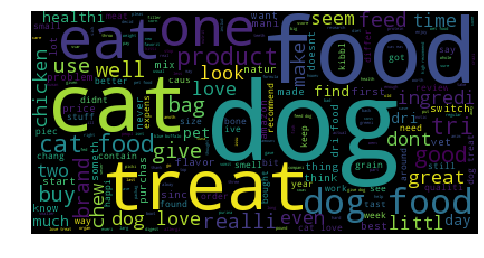





Printing 4 random reviews from cluster 1
10891    Online research told me this was the best cat food out there.  No question it was the most expensive not to mention the most redolent.  The only problem was my cat begged to differ - he did not particularly like it.  He would eat it but preferred his old, less expensive Iams.  As for me I did not try a taste but instead trusted my cat.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 

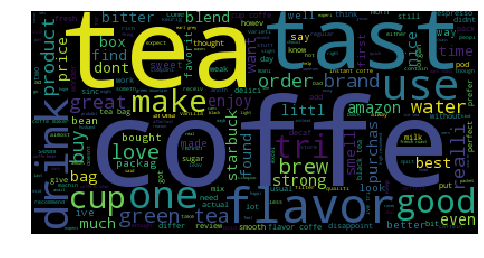





Printing 4 random reviews from cluster 2
9722    These tea packets are really cheap, but they are rather low quality. The taste is bland and acidic. The color of the tea is really reddish brown compared to real green tea.                                                                                                                                                                                                                                                                                                                                                                                                                                                      
9751    Buy these k-cups only if you don't mind drinking your coffee through a slick of coffee grounds.  The taste is fine (though not fantastic), but I don't enjoy the surface slick or the sludge left over at the bottom of the cup...and I'm not happy that I'm stuck either drinking this stuff or wasting my money by throwing the cups a

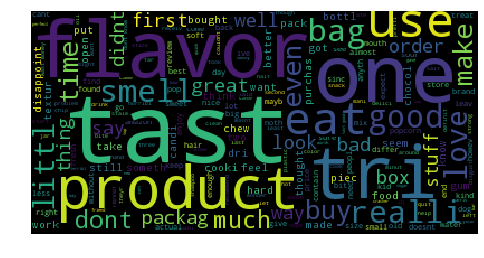





Printing 4 random reviews from cluster 3
10362    Sorry to say but this is not to my households taste.To be honest it does take somewhat like a Margarita  but perhaps one that has been sitting around after the party is way over.                                                                       
10375    I bought this for our office to give people something sweet to snack on.  Because it's bite size it's easier for people to grab a couple a pieces rather than an entire licorice stick. My only complaint is that one of the bags broke open in shipping.
10378    These tasted really bad. They weren't expired, and there's only 3 steps to making them, so I don't know how they turned out so disgusting, but they did. There was a lingering bitter taste and no fudge taste to it.                                    
10394    The trap is difficult to set.  It requires a lot of physical exertion, and it is very awkward to set. The trigger mechanism goes from hard to spring to a hair trigger. T

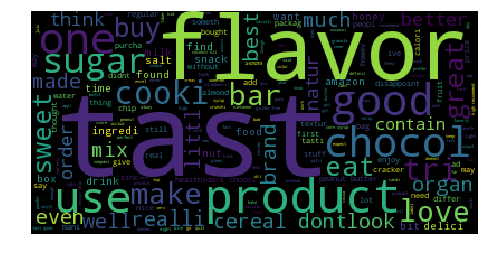





Printing 4 random reviews from cluster 4
9376    I saw the name "Chips Ahoy!" and thought of delicious, crispy chocolate chippy goodness. Alas, these don't live up to the brand name.<br /><br />I rarely buy storebought cookies, honestly, so I really looked forward to trying these as a treat. Here's my two cents:<br /><br />1. The allegedly mega fudge filling is not very noticeable except as a faintly chemical, chocolate-like slime. Minifudge filling would have been more accurate. The last two days were quite warm and the cookies became almost liquid on contact with warm fingers. Quite a mess, especially with kids. In short, the gooey filling seems to me a gimmick.<br /><br />2. The cookie part tasted like fake chocolate, which was a turnoff for me. I love chocolate like nobody's business, but it has to be GOOD chocolate (which this was definitely NOT.) A chocolate candy bar of almost any kind would have been more satisfying.<br /><br />If I want a tender cookie, I can make better o

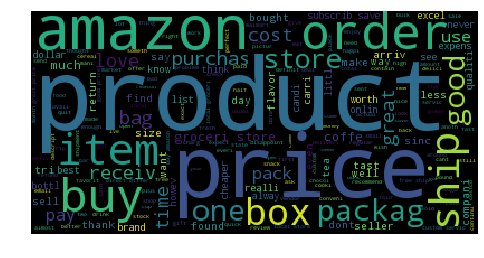





Printing 4 random reviews from cluster 5
9332    Awesome product, not on the shelves in our grocery store anymore.  Love that I can get this through Amazon.com!                                                                                                                                                                                                                                                     
9337    Thank you so much for enabling me to get this product. We live in a small town and things like this are very hard to find around here. The Pancetta was great. Quick delivery too! Thanks!!                                                                                                                                                                         
9365    This is not a good deal.  I can go to target or other grocery stores and buy four boxes for at least $6.00 cheaper...                                                                                                    

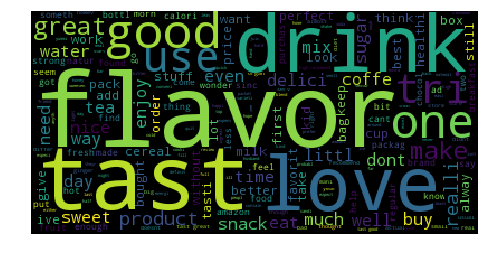





Printing 4 random reviews from cluster 6
10073    Do not buy this!!! I love boba tea drinks. I've spent a small fortune buying them. To save money I realized it would be cheaper to find the ingredients and make it myself so I bought this powder. This is not yogurt powder! This is yogurt creamer, BIG DIFFERENCE! Tastes nothing like the drink I'm use to. The powder itself barely tastes sweet. Imagine buying creamer and adding it to black tea that is what you will get, gross. This creamer is not sweet nor does it taste like yogurt or at least the fake boba yogurt flavor that most Asians are familiar with. If you want to make real yogurt black tea or green tea boba drink then buy the syrup and not the powder. Trust me you will thank me!<br /><br />I think this powder is used for making yogurt milk tea or the yogurt ice blended drink but you have to add the yogurt syrup, sold separately.                                                                                                     

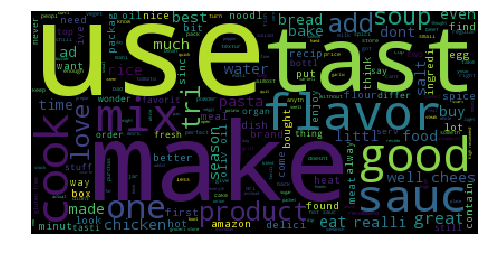





Printing 4 random reviews from cluster 7
9242    I mix this with 0% fat plain greek yogurt (I buy Fage) for a rich flavored no guilt dip! I sometimes add extra minced fresh onion, maybe  chopped fresh chives or parsley, too. You can add a little extra powdered garlic or onion powder if you want a stronger dip.  Depends what I'll be dipping.  Carrots sticks, broccoli, celery- it all goes well with this dip! Refridgerate overnight if you want the flavors to blend.  A very nice mix that doesn't have the fake additives, color, msg or msg-like ingredients.  If you like dip but don't like the guilt, mix this with 0% fat greek yogurt!!! I forgot- for extra kick, add a tiny bit of horseradish...good on top of a chopped up grilled steak sandwich!                                                                                                                                                                                                                                                         

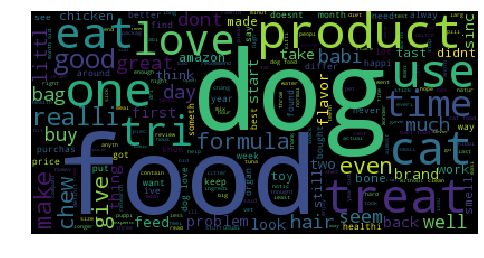





Printing 4 random reviews from cluster 8
10691    My pup, Miltie, is 7.5 months old and so far he's not tired of the Zuke's treats at all, and he's had them since the first month I brought him home. He sometimes eats too fast, but I've had no problem with him throwing up. Other treats have given him "poopy" messes, but he doesn't have that with Zuke's, which are worth the money.  He's had PB & Chicken mini treats, Filet Mignon chews...he adores them all, and the 16-oz. bag of mini treats can last him a long time. The trainer is his puppy kindergarten class recommended these, and I'm glad she did.<br />I'd like to get the "Dental Fresh Breath" treats, but Amazon.com doesn't ship them and the shipping is almost as much as the product...that's not cool.                                                                                                                                                                                                                                            

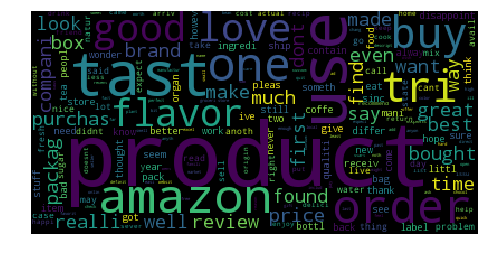





Printing 4 random reviews from cluster 9
10625    The guar gum was decent and was a good price.  The packaging is kind of cheap so I didn't give it 5 stars.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           
10634    I have been longing for Sunshine biscuits forever; I was so bummed when they were taken off of our grocery shelves, and while garibaldi biscuits are equally yummy, they were hard to get until just recently through Amazon.  A couple of years ago, I found these Khong Guan biscuits at our local Asian market and took a chance, and I'm glad I did.  They're p

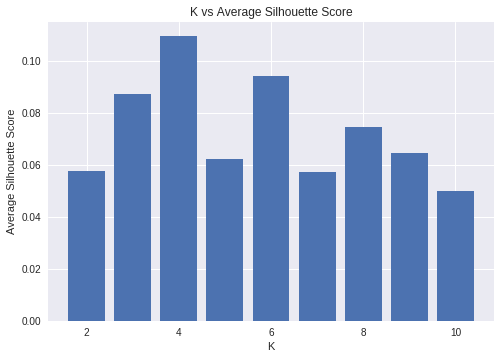

The average Silhouette value of K = 2 is 0.057725319364915685
The average Silhouette value of K = 3 is 0.08717934266378435
The average Silhouette value of K = 4 is 0.1096229800099798
The average Silhouette value of K = 5 is 0.06216470184980375
The average Silhouette value of K = 6 is 0.09407919121588772
The average Silhouette value of K = 7 is 0.057118564464137773
The average Silhouette value of K = 8 is 0.0745233012786393
The average Silhouette value of K = 9 is 0.06476988060736824
The average Silhouette value of K = 10 is 0.050078052761093644




We can observe that K = 4 has the highest average silhouette score of 0.1096229800099798.






The wordcloud and reviews for optimal K = 4 is plotted as follows.




Creating a dataframe with Reviews, Cleaned text and Clusters...
Dataframe is created!


The number of reviews in each cluster is:
3    9716
2    7805
0    1501
1    978 
Name: Clusters, dtype: int64


**********************************************************************


The 

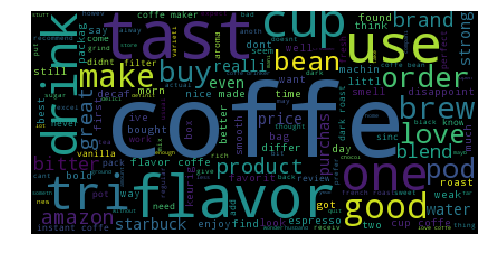





Printing 4 random reviews from cluster 0
10524    My sister recently came back from a trip to DR, and knowing how much I love coffee, brought this back for me. Im an avid coffee drinker, and very picky about what I drink. Its always either freshly ground starbucks, or a freshly ground organic fair trade coffee. But as soon as I tasted this, I was in love! I don't like any of those fancy creamers in my coffee, except if its a specialty latte. And this coffee doesnt need a thing! Its so smooth, great flavor, with yummy chocolate undertones. Im so glad I found this on amazon! I thought I would be having to make a trip all the way to DR just to go get some. ;)
10534    Maxwell House International Coffee took over the General Foods International coffee line, and the chocolate coffee line shrank to almost nothing. Finally they come out with an attempt to give us back our Mocha, but what a price!!<br />I am being miserly with my order of Suisse Mocha Latte singles because it is the closes

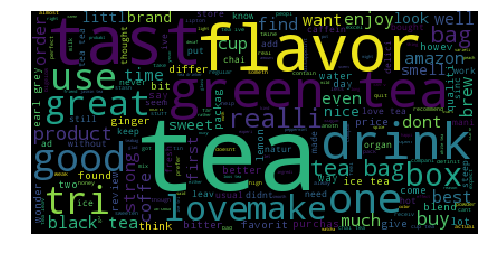





Printing 4 random reviews from cluster 1
8387    I received a sachet of this tea when I ordered hot tea in a restaurant. It was so yummy that I put the empty packet in my wallet so I could look for it in a store. In every store I went into that sold tea, I'd pull out that packet and compare. I couldn't find it anywhere. They have it, of course, at the Good Earth web store but with shipping the cost was more than I wanted to pay. (Thank goodness for Amazon Prime!)<br /><br />I bought a case (6 boxes). So far, I've shared two boxes - one, a birthday gift for my best friend and one with my daughter in a college care-package.<br /><br />Hot or cold, black or green, this is my favorite jasmine tea.                                                                                                                                                                                                                                                                                                      

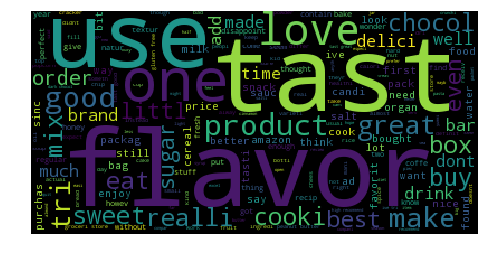





Printing 4 random reviews from cluster 2
9479    Although we are not enthusiastic seafood eaters, this tartar sauce really makes all the difference; it's rich and creamy. We had purchased one bottle locally, but could never find it again so we decided to just buy a dozen bottles.  This tartar sauce is not the least expensive one, but the taste makes it worth the price.<a href="http://www.amazon.com/gp/product/B000LLIV9U">Louisiana Tarter Sauce, 10.5-Ounce Bottles (Pack of 12)</a>
9482    It was exactly what I wanted for my husband who is a huge candy lover! All the candy was fresh and we had a blast enjoying all the "old school" candy.                                                                                                                                                                                                                                                                                             
9483    The vanilla beans arrived very quickly.  They are all soft,

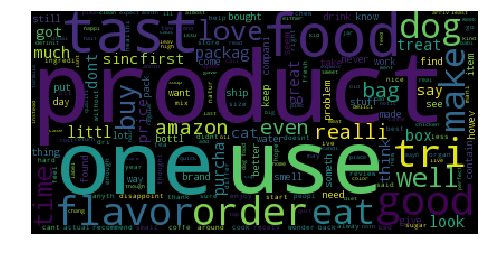





Printing 4 random reviews from cluster 3
10445    Why have we become such consumers of crap sold to us in the name of "good for you"<br />stuff made in an artificial/chemical manner and void of goodness?<br /><br />Please read the following and be educated!<br /><br />[...]<br />[...]<br /><br />you have to of course copy and paste these internet addresses in your browser's<br />address bar!                                                                                                             
10446    I bought a case of this as part of my canned survival food storage. Needless to say it tastes awful and won't order anymore. I love molasses but for some reason I just can't stomach this. I was hoping it'd be a "canned comfort food" for a survival situation, but the only comfort would be not opening it in the first place.<br /><br />There's so many more options ouch there, canned bread is just not a good idea.                                        
10447    Had this at the Shel

In [0]:
implement_kmedoids(grouped_data,data,D)

## Observations: 

**1.** Wordcloud and reviews are printed for k values of 2, 5, 10 to get a sense of what's going on  with the data.

**2.** Silhouette scores are plotted for each values of k ranging from 2 to 10. It is observed that k=4 has the highest average silhouette score, hence we declare that k=4 is the best suited number of clusters.

**3.** Since the average value of all the silhouette scores is around 0.06, so almost all k values except 2, 7, 10 can perform reasonably well.

**4.** When k=4, cluster 0 has 1501 elements compared to 978 in cluster 1, 7805 in cluster 2 and 9716 in cluster 3.

**5.** Four medoids are formed and their reviews are printed above.

# Summary

1) Import the csv file containing pre processed data which is already arranged on the basis of time.

2) Five functions are created for input k,  plotting wordcloud, performing k means, k medoid function and k medoid implementation.

3) The second function creates a dataframe with all the reviews, cleaned text and clusters. Then it prints the number of data points in each cluster. A wordcloud is then plotted along with a few random reviews from that cluster.

4) The third function performs k means by plotting inertia values and after chosing the best k value, it calls the wordcloud function mentioned above.

5) The fourth function is a k medoid implementation by https://github.com/letiantian/kmedoids.

6) The fifth function is implementation of K medoid function which uses silhouette scores to predict the best k and also prints the medoid reviews.

5) These functions are applied on Bag of Words, TFIDF, avg Word2Vec and TFIDF Word2Vec.